# Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%cd {'drive/MyDrive/DJIA'}

/content/drive/MyDrive/DJIA


In [ ]:
%pwd

'/content/drive/MyDrive/DJIA'

### Load Kaggle Datasets

In [ ]:
!pip install -q kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

The dataset we are going to use if from:

Sun, J. (2016, August). Daily News for Stock Market Prediction, Version 1. Retrieved [11/24/2021] from [Kaggle-stocknews](https://www.kaggle.com/aaron7sun/stocknews)

.

In [ ]:
!kaggle datasets download aaron7sun/stocknews

stocknews.zip: Skipping, found more recently modified local copy (use --force to force download)


_Unzip datasets_

In [ ]:
!unzip stocknews.zip -d data

Archive:  stocknews.zip
replace data/Combined_News_DJIA.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace data/RedditNews.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace data/upload_DJIA_table.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n



# Load Libraries and set environment

In [1]:
# If not in drive, execute
%cd {'drive/MyDrive/DJIA'}

/content/drive/MyDrive/DJIA


In [2]:
%load_ext autoreload
%autoreload 1

In [3]:
# check if images directory exists. If it doesn't, create it.
import os
if not os.path.isdir("images"):  # Returns True if exist
    os.mkdir('images')

if not os.path.isdir("models"):
    os.mkdir('models')

_Ignore warnings_

In [4]:
import warnings
warnings.filterwarnings('ignore')

_Basic libraries_

In [5]:
# system to check versions
import sys
# string manipulation
import re
import ast
import string
!pip install -q contractions
import contractions
# save files
import pickle
import h5py as h5
# load bar
from tqdm.notebook import tqdm

import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
from collections import Counter

_Plotting libraries_

In [6]:
# seaborn configuration
import seaborn as sns
sns.set_style({'axes.grid' : False, 'ticks' : False})
sns.set(rc={'figure.figsize' : (8, 6)})

# matplotlib configuration
import matplotlib.pyplot as plt
%matplotlib inline

# plotly utils
import plotly.express as px
import plotly.figure_factory as ff
from plotly import graph_objects as go

# wordcloud visualization
from wordcloud import WordCloud, STOPWORDS as wc_STOPWORDS

# EDA

### Read Data

In [7]:
combined_news = pd.read_csv('data/Combined_News_DJIA.csv', encoding='utf-8')
reddit_news = pd.read_csv('data/RedditNews.csv', encoding='utf-8')
djia_ts = pd.read_csv('data/upload_DJIA_table.csv')

_Set date as index_

In [8]:
dfs = [combined_news, djia_ts, reddit_news]
dfs = [df.set_index(pd.to_datetime(df['Date'])) for df in dfs]
dfs = [df.drop(['Date'], axis=1) for df in dfs]
[combined_news, djia_ts, reddit_news] = dfs

## News EDA

### Dataframe visualization

_Visualize the dimensions of the dataset_

In [ ]:
combined_news.shape

(1989, 26)

We can see there are $1484$ instances of $26$ variables.

_Preview the dataset_

In [ ]:
combined_news.head()

,Label,Top1,Top2,Top3,Top4,Top5,Top6,Top7,Top8,Top9,Top10,Top11,Top12,Top13,Top14,Top15,Top16,Top17,Top18,Top19,Top20,Top21,Top22,Top23,Top24,Top25
Date,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-08-08,0,"b""Georgia 'downs two Russian warplanes' as cou...",b'BREAKING: Musharraf to be impeached.',b'Russia Today: Columns of troops roll into So...,b'Russian tanks are moving towards the capital...,"b""Afghan children raped with 'impunity,' U.N. ...",b'150 Russian tanks have entered South Ossetia...,"b""Breaking: Georgia invades South Ossetia, Rus...","b""The 'enemy combatent' trials are nothing but...",b'Georgian troops retreat from S. Osettain cap...,b'Did the U.S. Prep Georgia for War with Russia?',b'Rice Gives Green Light for Israel to Attack ...,b'Announcing:Class Action Lawsuit on Behalf of...,"b""So---Russia and Georgia are at war and the N...","b""China tells Bush to stay out of other countr...",b'Did World War III start today?',b'Georgia Invades South Ossetia - if Russia ge...,b'Al-Qaeda Faces Islamist Backlash',"b'Condoleezza Rice: ""The US would not act to p...",b'This is a busy day: The European Union has ...,"b""Georgia will withdraw 1,000 soldiers from Ir...",b'Why the Pentagon Thinks Attacking Iran is a ...,b'Caucasus in crisis: Georgia invades South Os...,b'Indian shoe manufactory - And again in a se...,b'Visitors Suffering from Mental Illnesses Ban...,"b""No Help for Mexico's Kidnapping Surge"""
2008-08-11,1,b'Why wont America and Nato help us? If they w...,b'Bush puts foot down on Georgian conflict',"b""Jewish Georgian minister: Thanks to Israeli ...",b'Georgian army flees in disarray as Russians ...,"b""Olympic opening ceremony fireworks 'faked'""",b'What were the Mossad with fraudulent New Zea...,b'Russia angered by Israeli military sale to G...,b'An American citizen living in S.Ossetia blam...,b'Welcome To World War IV! Now In High Definit...,"b""Georgia's move, a mistake of monumental prop...",b'Russia presses deeper into Georgia; U.S. say...,b'Abhinav Bindra wins first ever Individual Ol...,b' U.S. ship heads for Arctic to define territ...,b'Drivers in a Jerusalem taxi station threaten...,b'The French Team is Stunned by Phelps and the...,b'Israel and the US behind the Georgian aggres...,"b'""Do not believe TV, neither Russian nor Geor...",b'Riots are still going on in Montreal (Canada...,b'China to overtake US as largest manufacturer',b'War in South Ossetia [PICS]',b'Israeli Physicians Group Condemns State Tort...,b' Russia has just beaten the United States ov...,b'Perhaps *the* question about the Georgia - R...,b'Russia is so much better at war',"b""So this is what it's come to: trading sex fo..."
2008-08-12,0,b'Remember that adorable 9-year-old who sang a...,"b""Russia 'ends Georgia operation'""","b'""If we had no sexual harassment we would hav...","b""Al-Qa'eda is losing support in Iraq because ...",b'Ceasefire in Georgia: Putin Outmaneuvers the...,b'Why Microsoft and Intel tried to kill the XO...,b'Stratfor: The Russo-Georgian War and the Bal...,"b""I'm Trying to Get a Sense of This Whole Geor...","b""The US military was surprised by the timing ...",b'U.S. Beats War Drum as Iran Dumps the Dollar',"b'Gorbachev: ""Georgian military attacked the S...",b'CNN use footage of Tskhinvali ruins to cover...,b'Beginning a war as the Olympics were opening...,b'55 pyramids as large as the Luxor stacked in...,b'The 11 Top Party Cities in the World',b'U.S. troops still in Georgia (did you know t...,b'Why Russias response to Georgia was right',"b'Gorbachev accuses U.S. of making a ""serious ...","b'Russia, Georgia, and NATO: Cold War Two'",b'Remember that adorable 62-year-old who led y...,b'War in Georgia: The Israeli connection',b'All signs point to the US encouraging Georgi...,b'Christopher King argues that the US and NATO...,b'America: The New Mexico?',"b""BBC NEWS | Asia-Pacific | Extinction 'by man..."
2008-08-13,0,b' U.S. refuses Israel weapons to attack Iran:...,"b""When the president ordered to attack Tskhinv...",b' Israel c

_View the date range_

In [ ]:
combined_news.index

DatetimeIndex(['2008-08-08', '2008-08-11', '2008-08-12', '2008-08-13',
               '2008-08-14', '2008-08-15', '2008-08-18', '2008-08-19',
               '2008-08-20', '2008-08-21',
               ...
               '2016-06-20', '2016-06-21', '2016-06-22', '2016-06-23',
               '2016-06-24', '2016-06-27', '2016-06-28', '2016-06-29',
               '2016-06-30', '2016-07-01'],
              dtype='datetime64[ns]', name='Date', length=1989, freq=None)

By now, we can already see there is one variable to predict (Label) and $25$ headlines every day.
These represent the top $25$ most relevant news every day from $2008$ to $2016$

_Get summary of the dataset_

In [ ]:
combined_news.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1989 entries, 2008-08-08 to 2016-07-01
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Label   1989 non-null   int64 
 1   Top1    1989 non-null   object
 2   Top2    1989 non-null   object
 3   Top3    1989 non-null   object
 4   Top4    1989 non-null   object
 5   Top5    1989 non-null   object
 6   Top6    1989 non-null   object
 7   Top7    1989 non-null   object
 8   Top8    1989 non-null   object
 9   Top9    1989 non-null   object
 10  Top10   1989 non-null   object
 11  Top11   1989 non-null   object
 12  Top12   1989 non-null   object
 13  Top13   1989 non-null   object
 14  Top14   1989 non-null   object
 15  Top15   1989 non-null   object
 16  Top16   1989 non-null   object
 17  Top17   1989 non-null   object
 18  Top18   1989 non-null   object
 19  Top19   1989 non-null   object
 20  Top20   1989 non-null   object
 21  Top21   1989 non-null   object
 22  Top22 

We see that all our predictor variables (in this dataset) are texts, headlines. So we will have to deal with them using some nlp methods. They will require more preprocessing than numeric variables.

_Label statistics_

In [ ]:
combined_news.describe()

,Label
count,1989.000000
mean,0.535445
std,0.498867
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


At first glance, we see we have $1989$ instances, and that there seem to be more days in up trend than in down trend. Seems to be slightly skewed towards the buy-side ($1$).

_Headlines statistics_

In [ ]:
combined_news.describe(include=['object'])

,Top1,Top2,Top3,Top4,Top5,Top6,Top7,Top8,Top9,Top10,Top11,Top12,Top13,Top14,Top15,Top16,Top17,Top18,Top19,Top20,Top21,Top22,Top23,Top24,Top25
count,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1988,1986,1986
unique,1989,1989,1988,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1989,1988,1986,1986
top,Canada bill that bans wearing masks during an ...,b'10 dead after teen shooting rampage at Germa...,Putin: Who gave NATO right to kill Gaddafi?,Chinese state media thanks women for being hot...,Cairo court sentences 4-year-old boy to life i...,"Some Afghan Boys Are Girls - \nFascinating, qu...",Thousands of Turkish Students Demand Jedi Temp...,b'UK government set to rush through the Digita...,UN calls for Syrian president to step down,Israel Police: Hundreds watched attempt to lyn...,"In ground-breaking move, S. Africa steps in ov...",b'(pics) Battles rage in Congo',"Turkey: 1,845 cases opened for insulting Erdogan",Former Israeli military intelligence chief Amo...,Pakistan: Court condemns U.S. drone attack as ...,Top-secret documents obtained by the CBC show ...,Berlusconi will not seek reelection,Pakistan test-fires 2nd nuclear-capable missil...,innfluential magazine Der Spiegel calls for Gr...,"North Korea to target U.S. with nuclear, rocke...","b'South African President Zuma marries again ""...",Greece was paralysed on Wednesday morning as t...,b'Iran comes out on top in secret simulated wa...,Kuwaiti security forces fired tear gas to disp...,"b""Pompeii family's final hours reconstructed"""
freq,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


There don't seem to be any repeated values except for column 3, were there is a repeated headline: _Putin: Who gave NATO right to kill Gaddafi?_, which happens to appear twice in the $top3$ column.

In fact, we know that's the only repetition because if we look at the _unique_ row, the lowest value is $1988$, shich is just one repeated value.

### Target Analysis

First, check for missing values

In [ ]:
combined_news['Label'].isnull().sum()

0

As expected, there are no missing values, so we can move on.

View values or target can get

In [ ]:
combined_news['Label'].unique()

array([0, 1])

Label can only get $0$ and $1$, which, if we read the documentation, corresponds to: $0$, the market goes down, $1$ the market stays the same or goes up.

_Frequency distribution of target_

In [ ]:
combined_news['Label'].value_counts()

1    1065
0     924
Name: Label, dtype: int64

In [ ]:
combined_news['Label'].value_counts()/combined_news.shape[0]

1    0.535445
0    0.464555
Name: Label, dtype: float64

So, as we mentioned earlier, our datset is skewed towards the buy-side. However, that does not mean that on out-of-bag data, it is going to keep being like this, so we won't use any methods to make them more or less probable. If we look at the percentages, we see that about $53.5$ of the days, the market goes up, and about $46.4$ of the days, the market goes down. That is, a buy-hold strategy would most probably made profit (assuming that the volatility remains pretty much the same between up and down days, we will inspect that more in-depth when we examine the time series with the OHLCV data).

#### Target Distribution Plots

**Bar chart**

In [ ]:
fr_df = pd.DataFrame(combined_news['Label'].value_counts(), 
                     combined_news['Label'].unique())

In [ ]:
fr_df

,Label
0,924
1,1065


In [ ]:
fig = px.bar(fr_df, x=fr_df.index, y=fr_df.Label,
            labels={'x':'Label', 'Label':'Value Counts'},
            color=fr_df.index,             
             )    
fig.show(figsize=(6, 8))

This visualization allows us to see the $7\%$ difference between both targets.

**Pie chart**

In [ ]:
px_df = pd.DataFrame(combined_news['Label'].value_counts()/combined_news.shape[0])

In [ ]:
labs = px_df.index
fig = px.pie(px_df, values='Label', 
             names=labs, color=labs,
             color_discrete_map={1 : 'brown',
                                 0 : 'royalblue'},
            )
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Just another representation of the same ratio, but from a $\%$ point of view, which might be more convinient for this case.

### Text Analysis

#### News Most Common Words Visualization

In order to perform this EDA, we will have to first clean it, so that the words that come up are actually relevant and not just stop words. We are probably interested in nouns and possibly verbs, but not in prepositions. 

Since we are now going to be focusing on texts, we shall make use of the _RedditNews_ dataset, which contains all the news in a single column, so it will be easier to manipulate it for topic modelling, word-distance and so on.

In [ ]:
reddit_news.sort_index(ascending=True, inplace=True)

Since we will have to preprocess our text before moving on to models, we will check some statistics of our texts before preprocessing. Then, we will preprocess it, that is, lemmatization, stop-words removal, tokenization, vectorization...

In [ ]:
reddit_news

,News
Date,
2008-06-08,"b'Marriage, they said, was reduced to the stat..."
2008-06-08,b'Nim Chimpsky: The tragedy of the chimp who t...
2008-06-08,"b""Canada: Beware slippery slope' to censorship..."
2008-06-08,b'EU Vice-President Luisa Morgantini and the I...
2008-06-08,"b""Israeli minister: Israel will attack Iran if..."
...,...
2016-07-01,"Venezuela, where anger over food shortages is ..."
2016-07-01,A Hindu temple worker has been killed by three...
2016-07-01,Ozone layer hole seems to be healing - US &amp...


In [ ]:
all_words = reddit_news['News'].str.split(expand=True).unstack().value_counts()
data = [go.Bar(
            x = all_words.index.values[2:50],
            y = all_words.values[2:50],
            marker= dict(colorscale='Jet',
                         color = all_words.values[2:100]
                        ),
            text='Word counts'
    )]

layout = go.Layout(
    title='Top 50 (Uncleaned) Word frequencies in the training dataset'
)

fig = go.Figure(data=data, layout=layout)

# py.iplot(fig, filename='basic-bar')
fig.show()

As we expected, most common words are basically stop words. However, we see some words like US, China and government, which appear in our top $50$ despite not having cleaned the dataset.

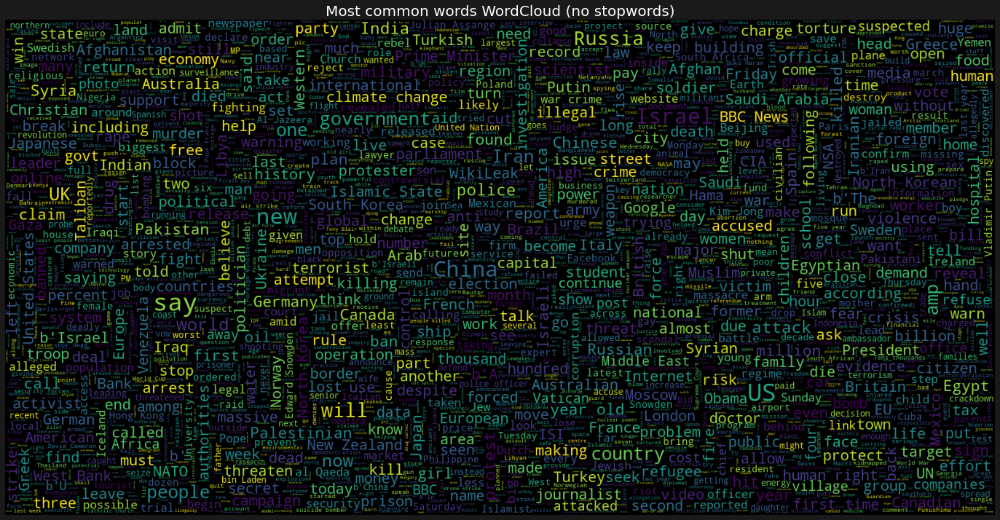

In [ ]:
wc = WordCloud(background_color="black", max_words=10000, 
               stopwords=wc_STOPWORDS, max_font_size=40,
               width=1600, height=800
               )
wc.generate(" ".join(reddit_news['News'].values))
plt.figure(figsize=(20, 10), facecolor='k')
plt.title("Most common words WordCloud (no stopwords)", fontsize=20, color='w')
plt.imshow(wc)
plt.tight_layout(pad=0)
plt.axis('off')
# save the image
plt.savefig('images/wordcloud_20x10.png', facecolor='k', bbox_inches='tight');
plt.show()

Later in the notebook, once we have performed topic modelling on our data, we will again perform a wordcloud, but for each of the topics found. This way, we will be able to see if there are notable differences between the topics found. In addition, we will visualize the distance between words to see how do relationships between words vary depending on the topic.

#### Preprocessing

In order to perform further analysis with texts we will do some preprocessing. We will perform two different preprocessings, since we will be using LDA (Latent Dirichlet Analysis) and BERT (Bidirectional Encoder Representation of Transofrmers) for topic modelling. The latter needs context, so we won't be removing stop-words.

Since we don't know the best number of topics beforehand for our news, we will make use of the Hierarchical Dirichlet Process, see: [non-parametric-models](https://towardsdatascience.com/dont-be-afraid-of-nonparametric-topic-models-part-2-python-e5666db347a) for more information. 

The difference between the HIerarchical Dirichlet process (HDP) and the Latent Dirichlet Allocation (LDA) is that unlike the latter, this one is capable to infer the number of topics from the data. We will be making use of [gensim hdpmodel](https://radimrehurek.com/gensim/models/hdpmodel.html).

In [ ]:
from src.nlp_utils.preprocessing import clean_news, apply_ngrams

In [ ]:
reddit_news['clean'], ngrams_df = clean_news(reddit_news.News)

In [ ]:
reddit_news.to_csv('data/clean_reddit_news.csv', encoding='utf-8')
reddit_news

,News,clean
Date,,
2008-06-08,"b'Marriage, they said, was reduced to the stat...","[marriage, say, reduce, status, commercial, tr..."
2008-06-08,b'Nim Chimpsky: The tragedy of the chimp who t...,"[nim, chimpsky, tragedy, chimp, think, boy, pr..."
2008-06-08,"b""Canada: Beware slippery slope' to censorship...","[canada, beware, slippery, slope, censorship, ..."
2008-06-08,b'EU Vice-President Luisa Morgantini and the I...,"[vice, president, luisa, morgantini, irish, no..."
2008-06-08,"b""Israeli minister: Israel will attack Iran if...","[israeli, minister, israel, attack, iran, aban..."
...,...,...
2016-07-01,"Venezuela, where anger over food shortages is ...","[venezuela, anger, food, shortage, mount, cont..."
2016-07-01,A Hindu temple worker has been killed by three...,"[hindu, temple, worker, kill, man, motorcycle,..."
2016-07-01,Ozone layer hole seems to be healing - US &amp...,"[ozone, layer, hole, healing, amp, team, show,..."


In [ ]:
ngrams_df.reset_index(drop=True, inplace=True)

In [ ]:
ngrams_df.to_csv('data/ngrams_df.csv', encoding='utf-8')

In [ ]:
ngrams_df

,word,freq,ngrams
0,"[north, korea]","(1005, 8704.072628288539)",1
1,"[year, old]","(914, 1624.7861289252542)",1
2,"[human, rights]","(679, 4057.4629882489244)",1
3,"[prime, minister]","(565, 28953.38308457711)",1
4,"[saudi, arabia]","(542, 104800.17806841047)",1
...,...,...,...
5330,"[hospital, staff]","(6, 10.392196428571427)",1
5331,"[anti, kremlin]","(6, 10.347112580897518)",1
5332,"[facing, trial]","(6, 10.158549783549784)",1
5333,"[internet, piracy]","(6, 10.158195147495201)",1


In [ ]:
ngram_words_list = apply_ngrams(reddit_news.clean, ngrams_df.word)

100%|██████████| 73608/73608 [17:03<00:00, 71.92it/s]


In [ ]:
reddit_news['ngrams'] = ngram_words_list

In [ ]:
ngram_reddit_news = reddit_news.copy(deep=True)

In [ ]:
ngram_reddit_news.drop(['clean'], axis=1, inplace=True)

In [ ]:
ngram_reddit_news.to_csv('data/reddit_ngram_news.csv', encoding='utf-8')

Now that we have cleaned our dataset and taken care of ngrams, we will proceed to perform HDP to infer the number of topics in the news.

#### HDP (Hierarchical Dirichlet Process)

In [ ]:
import ast
from src.nlp_utils.topic_modelling import *

import gensim.corpora as corpora
from gensim.models import HdpModel
from gensim.models import CoherenceModel
from gensim.test.utils import common_corpus, common_dictionary

In [ ]:
ngram_news = pd.read_csv('data/reddit_ngram_news.csv')
ngram_news

,Date,News,ngrams
0,2008-06-08,"b'Marriage, they said, was reduced to the stat...","['marriage', 'say', 'reduce', 'status', 'comme..."
1,2008-06-08,b'Nim Chimpsky: The tragedy of the chimp who t...,"['nim', 'chimpsky', 'tragedy', 'chimp', 'think..."
2,2008-06-08,"b""Canada: Beware slippery slope' to censorship...","['canada', 'beware', 'slippery', 'slope', 'cen..."
3,2008-06-08,b'EU Vice-President Luisa Morgantini and the I...,"['vice president', 'luisa', 'morgantini', 'iri..."
4,2008-06-08,"b""Israeli minister: Israel will attack Iran if...","['israeli', 'minister', 'israel', 'attack iran..."
...,...,...,...
73603,2016-07-01,"Venezuela, where anger over food shortages is ...","['venezuela', 'anger', 'food', 'shortage', 'mo..."
73604,2016-07-01,A Hindu temple worker has been killed by three...,"['hindu temple', 'worker', 'kill', 'man', 'mot..."
73605,2016-07-01,Ozone layer hole seems to be healing - US &amp...,"['ozone', 'layer', 'hole', 'healing', 'amp', '..."
73606,2016-07-01,Taiwanese warship accidentally fires missile t...,"['taiwanese', 'warship', 'accidentally', 'fire..."


In [ ]:
ngram_corpus = [ast.literal_eval(word) for word in ngram_news['ngrams']]

In [ ]:
id2word = corpora.Dictionary(ngram_corpus)
corpus = [id2word.doc2bow(text) for text in ngram_corpus]

In [ ]:
hdp, corpus = train_hdp(ngram_corpus)

In [ ]:
hdp.get_topics()

array([[1.55835302e-03, 1.07836829e-04, 1.64463835e-04, ...,
        7.95313863e-06, 3.39223779e-05, 1.48130394e-05],
       [1.04584047e-03, 1.29392117e-04, 8.65866355e-06, ...,
        6.73211241e-06, 8.66425876e-06, 6.47474258e-06],
       [9.85974076e-04, 7.31602457e-05, 3.84326431e-05, ...,
        1.69526408e-05, 2.13488647e-05, 6.86064205e-06],
       ...,
       [4.46804523e-04, 3.52335050e-05, 7.90790095e-05, ...,
        3.76458854e-05, 4.13729854e-06, 2.66991325e-05],
       [3.89253594e-04, 5.82101512e-05, 4.50468344e-05, ...,
        2.06093756e-05, 9.75712189e-06, 2.63654080e-06],
       [3.91032253e-04, 4.51858591e-05, 8.31560509e-05, ...,
        4.08426165e-05, 1.93956288e-06, 2.85313536e-05]])

In [ ]:
hdp.get_topics().shape

(150, 35803)

In [ ]:
hdp.save('models/ngram_hdp.gensim')

In [ ]:
hdp.print_topics(num_topics=-1)

In [ ]:
# load hdp model:
hdp = HdpModel.load('models/ngram_hdp.gensim')

WordCloud of some topics

In [ ]:
def get_topic_dict(hdp, ix, topn=10):
    topic = hdp.print_topic(ix, topn=topn)
    word_frec_list = [x.split("*") for x in topic.split("+")]
    wcloud_dict = {}
    for x in word_frec_list:
        key, value = ast.literal_eval(x[1]), ast.literal_eval(x[0].strip())
        wcloud_dict[key] = value
    return wcloud_dict

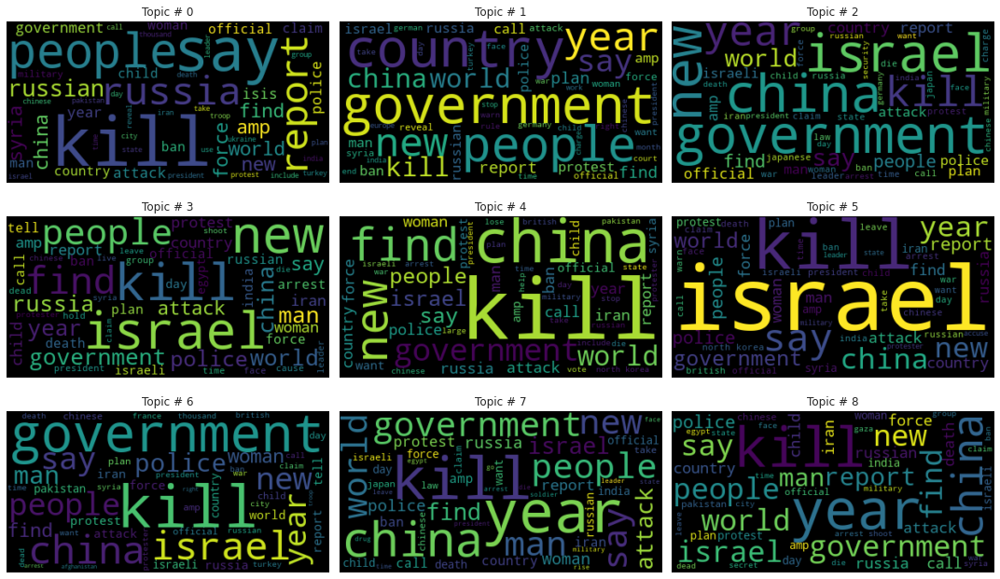

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(15,9))

row=0
col=0

# import random
# print(random.sample(range(150), 3))
# for ix in random.sample(range(150), 3):
for ix in range(9):
    cloud = WordCloud(background_color='black')
    wcloud_dict = get_topic_dict(hdp, ix, topn=50)
    # print(wcloud_dict)
    img = cloud.generate_from_frequencies(wcloud_dict)
    ax[row, col].imshow(img, interpolation='bilinear')
    ax[row, col].axis('off')
    ax[row, col].title.set_text("Topic # " + str(ix))
    col += 1
    if col == 3:
        col = 0
        row += 1
plt.tight_layout()

##### LDA from HDP

In [ ]:
hdp_lda = hdp.suggested_lda_model()

In [ ]:
embedding_lda = get_document_topic_lda(model=hdp_lda, corpus=corpus, k=hdp_lda.num_topics)

In [ ]:
labels_lda = lda_main_topic(hdp_lda, corpus)

In [ ]:
from sklearn.metrics import silhouette_score
print("Silhouette score:" )
print("LDA          : ", silhouette_score(embedding_lda, labels_lda) )

Silhouette score:
LDA          :  0.2203335468647989


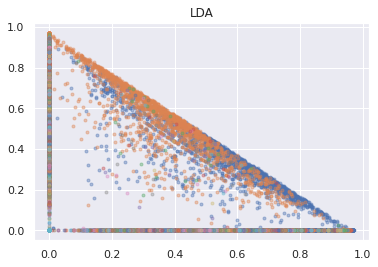

In [ ]:
plot_embeddings(embedding_lda, labels_lda, "LDA")

###### Umap

In [ ]:
embedding_umap_lda = reduce_umap(embedding_lda)

In [ ]:
import pickle

In [ ]:
# save umap lda embedding
with open('models/embedding_umap_lda.pkl','wb') as f:
    pickle.dump(embedding_umap_lda, f)

In [ ]:
with open('models/embedding_umap_lda.pkl', 'rb') as f:
    embedding_umap_lda = pickle.load(f)

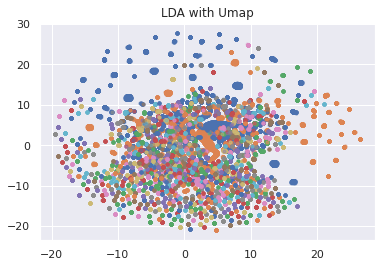

In [ ]:
plot_embeddings(embedding_umap_lda, labels_lda, "LDA with Umap")

In [ ]:
print("Umap-LDA    : ", silhouette_score(embedding_umap_lda, labels_lda) )

Umap-LDA    :  -0.48197758


From the plot we could infer teh silhouette score wouldn't be good. It is better not to use clustering in LDA, since it has a low dimensionality by itself. LDA (0.22) alone has a much better silhouette score than LDA with Umap (-0.48). Note that the silhouette score goes from $-1$ to $1$.

#### TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
def get_tfidf_embedding(items):
  tfidf = TfidfVectorizer()
  embeddings = tfidf.fit_transform(items)
  return embeddings

In [ ]:
sentences = [" ".join(ast.literal_eval(sent)) for sent in ngram_news['ngrams']]

In [ ]:
embedding_tf_idf = get_tfidf_embedding(sentences)
print(f"Shape of sentences with tf-idf : {embedding_tf_idf.shape}")

Shape of sentences with tf-idf : (73608, 32902)


In [ ]:
labels_tfidf_ = predict_topics_with_kmeans(embedding_tf_idf,num_topics=150)

In [ ]:
embedding_tf_idf_umap =  reduce_umap( embedding_tf_idf )
labels_tfidf_umap  = predict_topics_with_kmeans(embedding_tf_idf_umap,num_topics=150)

In [ ]:
embedding_tf_idf_tsne =  reduce_tsne( embedding_tf_idf )
labels_tfidf_tsne  = predict_topics_with_kmeans(embedding_tf_idf_tsne,num_topics=150)

In [ ]:
# PCA not supported, try Truncated SVD
# embedding_tf_idf_pca =  reduce_pca( embedding_tf_idf )
# labels_tfidf_pca  = predict_topics_with_kmeans(embedding_tf_idf_pca,num_topics=150)


In [ ]:
print("Silhouette score:" )
print("without dim reduction :", silhouette_score(embedding_tf_idf , labels_tfidf_) )
print("with Tf-idf   Umap    :", silhouette_score(embedding_tf_idf_umap, labels_tfidf_umap) )
print("with Tf-idf   T-sne   :",  silhouette_score(embedding_tf_idf_tsne, labels_tfidf_tsne) )
# print("with Tf-idf   PCA     :",  silhouette_score(embedding_tf_idf_pca, labels_tfidf_pca) )


Silhouette score:
without dim reduction : 0.018110830356769293
with Tf-idf   Umap    : 0.3491473
with Tf-idf   T-sne   : 0.36283982


Save best TF-idf

In [ ]:
tsne_tfidf = {'tsne_tfidf_embedding' : embedding_tf_idf_tsne, 
             'tsne_tfidf_labels': labels_tfidf_tsne}
with open('models/raw_bert.pkl','wb') as f:
    pickle.dump(tsne_tfidf, f)

Visualize best Tf-idf model

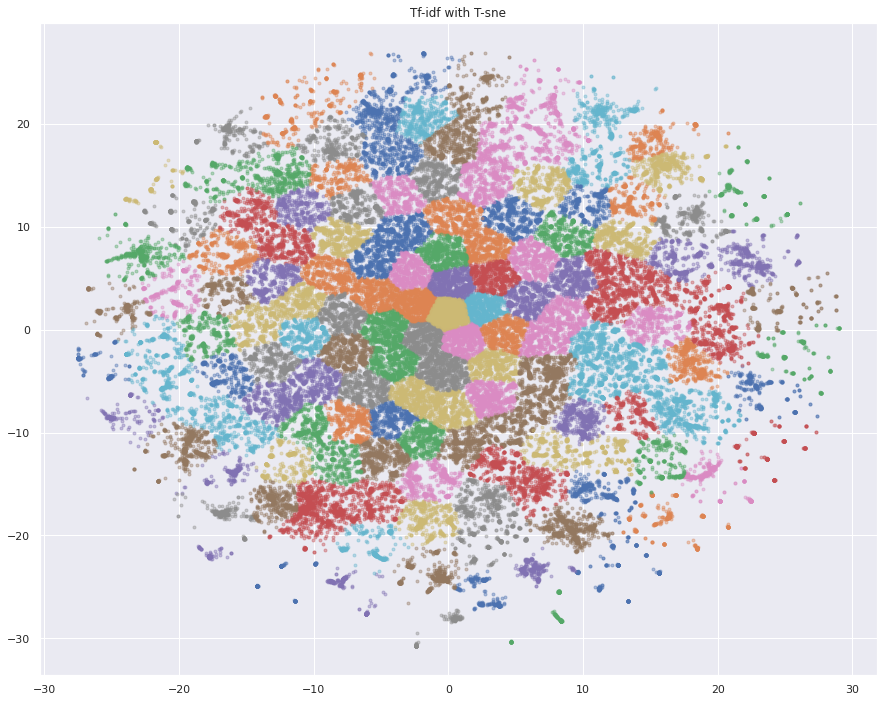

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(embedding_tf_idf_tsne,labels_tfidf_tsne,"Tf-idf with T-sne")

#### BERT sentence Transformers

In [ ]:
# remove just unicode marks, since it is better for bert to have full context.
bert_news = ngram_news.News.tolist()
bert_news = [re.sub(r'\bsay\S+\b', '', nw) for nw in bert_news]

# remove emails, newlines and single quotes
bert_news = [re.sub(r'\s+', ' ', nw) for nw in bert_news]
bert_news = [re.sub(r'\S*@\S*\s?', '', nw) for nw in bert_news]

# remove traces of byte strings: b' or b"
bert_news = [re.sub(r"b\'", "", nw) for nw in bert_news]
bert_news = [re.sub(r'b\"', "", nw) for nw in bert_news]

# remove quoting
bert_news = [re.sub(r"\'", "", nw) for nw in bert_news]

ngram_news['bert'] = bert_news

In [ ]:
!pip install -q sentence-transformers

In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
bert_model = SentenceTransformer('bert-base-nli-max-tokens')

Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.97k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/624 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/397 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
bert_embedding = np.array(bert_model.encode(bert_news, show_progress_bar=True))

Batches:   0%|          | 0/2301 [00:00<?, ?it/s]

Save Bert Embedding

In [ ]:
import pickle
with open('models/bert_embedding.pkl','wb') as f:
    pickle.dump(bert_embedding, f)

In [ ]:
print(f'Bert Embedding shape: {bert_embedding.shape}')
print(f'Bert sample {bert_embedding[0][0:50]}')

Bert Embedding shape: (73608, 768)
Bert sample [ 0.4489943   0.9930627   1.1972321   0.30983916  0.8645327   1.0671036
  1.9356081   0.59344816  0.95499486  0.65947855  0.93863195  1.3277963
  1.2004627   0.8173899  -0.26565465  0.350651    0.42699862  0.3772155
  1.6380063   0.9534912   0.13340409  0.616121    0.88235784  0.14428052
  1.5750836   0.7952856   1.1932346   0.6495616  -0.47905204 -0.18181834
  0.67806727  1.346648    0.72033954  0.98525393  0.7110997   0.6521748
  0.53901434  0.10135314 -0.09785798  0.8363571  -0.03370541  0.29555458
  0.7201953   1.0154387   0.6246331   0.29556757  0.5837405   0.9375074
  0.19857822 -0.02476498]


In [ ]:
# k-means without dimensionality reduction
labels_bert_ = predict_topics_with_kmeans(embeddings=bert_embedding, num_topics=150)  # set 150 because of HDP

In [ ]:
raw_bert = {'raw_bert_embedding' : bert_embedding, 
             'raw_labels_bert': labels_bert_}
with open('models/raw_bert.pkl','wb') as f:
    pickle.dump(raw_bert, f)

In [ ]:
umap_bert_embedding = reduce_umap(bert_embedding)
umap_labels_bert = predict_topics_with_kmeans(embeddings=umap_bert_embedding, 
                                              num_topics=150)  # set 150 because of HDP

Save embeddings and its corresponding labels

In [ ]:
umap_bert = {'umap_bert_embedding' : umap_bert_embedding, 
             'umap_labels_bert': umap_labels_bert}
with open('models/umap_bert.pkl','wb') as f:
    pickle.dump(umap_bert, f)

In [ ]:
pca_bert_embedding = reduce_pca(bert_embedding)
pca_labels_bert = predict_topics_with_kmeans(embeddings=pca_bert_embedding, 
                                             num_topics=150)  # set 150 because of HDP

pca explained_variance_  [10.46108896  8.65777711]
pca explained_variance_ratio_  [0.07567525 0.06263014]


In [ ]:
pca_bert = {'pca_bert_embedding' : pca_bert_embedding, 
             'pca_labels_bert': pca_labels_bert}
with open('models/pca_bert.pkl','wb') as f:
    pickle.dump(pca_bert, f)

In [ ]:
tsne_bert_embedding =  reduce_tsne( bert_embedding )
tsne_labels_bert  = predict_topics_with_kmeans(embeddings=tsne_bert_embedding, 
                                               num_topics=150)

In [ ]:
tsne_bert = {'tsne_bert_embedding' : tsne_bert_embedding, 
             'tsne_labels_bert': tsne_labels_bert}
with open('models/tsne_bert.pkl','wb') as f:
    pickle.dump(tsne_bert, f)

In [ ]:
print("Silhouette score:" )

print("Raw Bert" ,silhouette_score(bert_embedding, labels_bert_) )

print("Bert with PCA" ,  silhouette_score(pca_bert_embedding, pca_labels_bert) )

print("Bert with Tsne" , silhouette_score(tsne_bert_embedding, tsne_labels_bert) )


print("Bert with Umap" ,  silhouette_score(umap_bert_embedding , umap_labels_bert ) )


Silhouette score:
Raw Bert 0.020170327
Bert with PCA 0.31947005
Bert with Tsne 0.36179897
Bert with Umap 0.35900968


We see a big great performance increase. Bert with TSNE reduction is bthe best with a Silhouette score of 0.36, much better than the 0.22 we achieved using LDA. We will no go on to visualize the distribution.

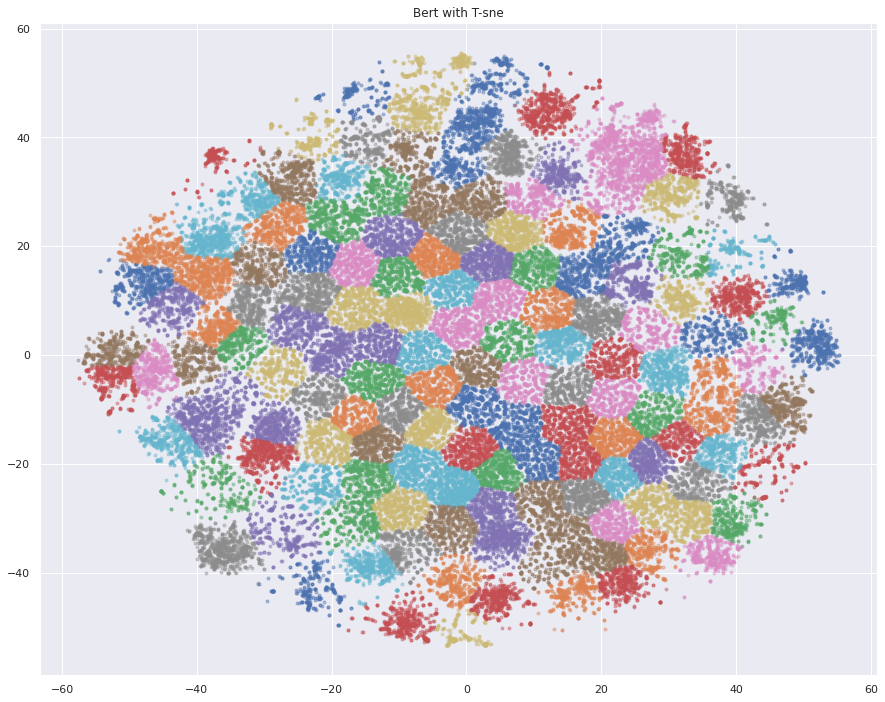

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(tsne_bert_embedding,tsne_labels_bert,"Bert with T-sne")


In [ ]:
plt.savefig('images/BERT_T-sne_150.png')

<Figure size 432x288 with 0 Axes>

We can also visualize the Umap

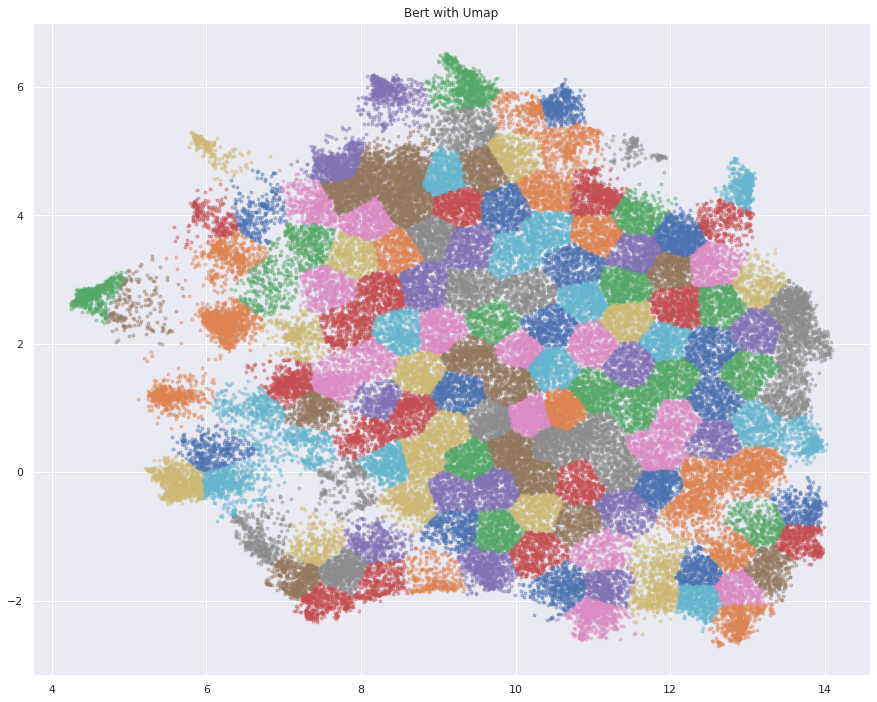

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(umap_bert_embedding, umap_labels_bert,"Bert with Umap")

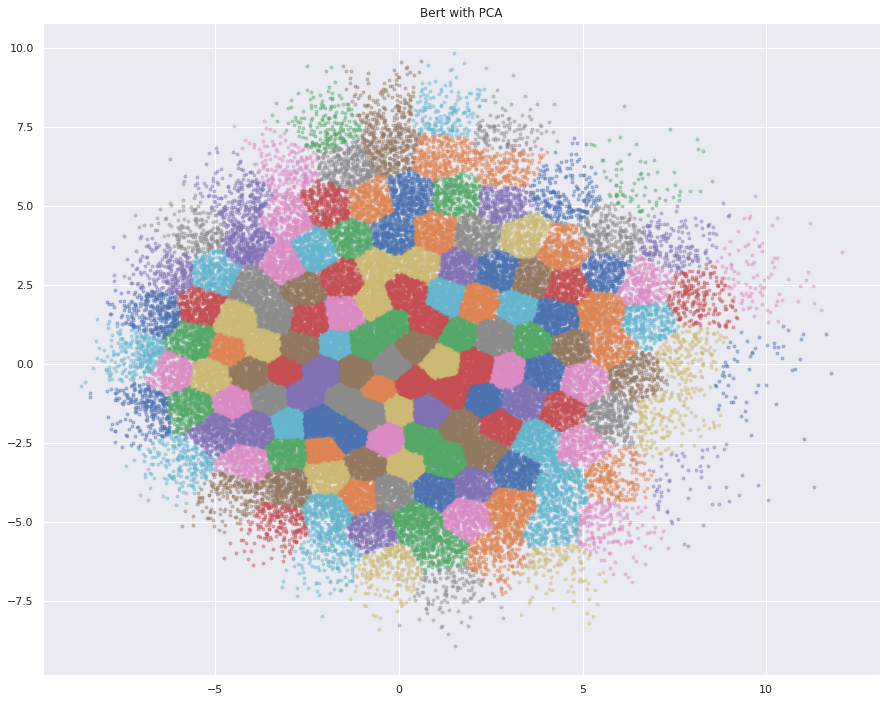

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(pca_bert_embedding, pca_labels_bert,"Bert with PCA")

After modelling the topic of each text, we will proceed to perform text classification using the topic and the embedding.

In [ ]:
tsne_labels_bert[:25]

array([103,  91,  63,  74,  31, 145,  69,  27,   9, 106,   5,  56, 134,
        48,  80,  98, 145,  10,   0, 103, 111,  91,  69,  85,  78],
      dtype=int32)

In [ ]:
ngram_news

,Date,News,ngrams,bert
0,2008-06-08,"b'Marriage, they said, was reduced to the stat...","['marriage', 'say', 'reduce', 'status', 'comme...","Marriage, they said, was reduced to the status..."
1,2008-06-08,b'Nim Chimpsky: The tragedy of the chimp who t...,"['nim', 'chimpsky', 'tragedy', 'chimp', 'think...",Nim Chimpsky: The tragedy of the chimp who tho...
2,2008-06-08,"b""Canada: Beware slippery slope' to censorship...","['canada', 'beware', 'slippery', 'slope', 'cen...","Canada: Beware slippery slope to censorship, h..."
3,2008-06-08,b'EU Vice-President Luisa Morgantini and the I...,"['vice president', 'luisa', 'morgantini', 'iri...",EU Vice-President Luisa Morgantini and the Iri...
4,2008-06-08,"b""Israeli minister: Israel will attack Iran if...","['israeli', 'minister', 'israel', 'attack iran...",Israeli minister: Israel will attack Iran if i...
...,...,...,...,...
73603,2016-07-01,"Venezuela, where anger over food shortages is ...","['venezuela', 'anger', 'food', 'shortage', 'mo...","Venezuela, where anger over food shortages is ..."
73604,2016-07-01,A Hindu temple worker has been killed by three...,"['hindu temple', 'worker', 'kill', 'man', 'mot...",A Hindu temple worker has been killed by three...
73605,2016-07-01,Ozone layer hole seems to be healing - US &amp...,"['ozone', 'layer', 'hole', 'healing', 'amp', '...",Ozone layer hole seems to be healing - US &amp...
73606,2016-07-01,Taiwanese warship accidentally fires missile t...,"['taiwanese', 'warship', 'accidentally', 'fire...",Taiwanese warship accidentally fires missile t...


#### BERT sentence Transformers with preprocessing

In [ ]:
import pickle
from src.nlp_utils.preprocessing import *

bert_news = clean_news(ngram_news['News'], stop=False, emojis=True, 
          postags=['NOUN', 'VERB', 'ADV', 'ADJ', 'PROPN', 'NUM', 'PART'])

In [ ]:
ngram_news['bert'] = bert_news[0]

In [ ]:
!pip install -q sentence-transformers

     |████████████████████████████████| 78 kB 4.6 MB/s 
     |████████████████████████████████| 3.4 MB 23.1 MB/s 
     |████████████████████████████████| 6.8 MB 57.3 MB/s 
     |████████████████████████████████| 1.2 MB 50.3 MB/s 
     |████████████████████████████████| 61 kB 531 kB/s 
     |████████████████████████████████| 596 kB 61.2 MB/s 
     |████████████████████████████████| 3.3 MB 58.8 MB/s 
     |████████████████████████████████| 895 kB 60.7 MB/s 


In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
bert_model_v2 = SentenceTransformer('bert-base-nli-max-tokens')

Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.97k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/624 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/397 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
import ast
bert_news = [" ".join(sent) for sent in ngram_news['bert']]

In [ ]:
bert_news

In [ ]:
bert_embedding_v2 = np.array(bert_model_v2.encode(bert_news, show_progress_bar=True))

Batches:   0%|          | 0/2301 [00:00<?, ?it/s]

Save Bert Embedding

In [ ]:
import pickle
with open('models/bert_embedding_v2.pkl','wb') as f:
    pickle.dump(bert_embedding_v2, f)

In [ ]:
print(f'Bert Embedding shape: {bert_embedding_v2.shape}')
print(f'Bert sample {bert_embedding_v2[0][0:50]}')

Bert Embedding shape: (73608, 768)
Bert sample [ 0.5406157   0.7081793   1.7528415   0.3186342   0.5545341   0.53902334
  1.7227795  -0.16192958  0.92659277  0.3208505   0.73861784  1.0244485
  1.1245413   0.4684819  -0.27116895  0.03765512  0.12316816  0.2625744
  1.180722    0.34921166  0.25898606  0.46156004  0.56620055 -0.01409733
  1.7591784   0.76106423  1.2402631   0.37143588 -0.02888828  0.07583573
  0.38555992  1.4147633   0.5478556   0.9171933   0.5970114   0.5269296
  0.6023265   0.47941637 -0.09141758  0.43988883 -0.0916857   0.22824262
  0.240826    0.9181729   0.42800945  0.01128473 -0.01253744  0.6811015
  0.03035397 -0.33546448]


In [ ]:
# k-means without dimensionality reduction
labels_bert_v2 = predict_topics_with_kmeans(embeddings=bert_embedding_v2, num_topics=150)  # set 150 because of HDP

In [ ]:
raw_bert_v2 = {'raw_bert_embedding' : bert_embedding_v2, 
             'raw_labels_bert': labels_bert_v2}
with open('models/raw_bert_v2.pkl','wb') as f:
    pickle.dump(raw_bert_v2, f)

In [ ]:
umap_bert_embedding_v2 = reduce_umap(bert_embedding_v2)
umap_labels_bert_v2 = predict_topics_with_kmeans(embeddings=umap_bert_embedding_v2, 
                                              num_topics=150)  # set 150 because of HDP

Save embeddings and its corresponding labels

In [ ]:
umap_bert_v2 = {'umap_bert_embedding' : umap_bert_embedding_v2, 
             'umap_labels_bert': umap_labels_bert_v2}
with open('models/umap_bert_v2.pkl','wb') as f:
    pickle.dump(umap_bert_v2, f)

In [ ]:
pca_bert_embedding_v2 = reduce_pca(bert_embedding_v2)
pca_labels_bert_v2 = predict_topics_with_kmeans(embeddings=pca_bert_embedding_v2, 
                                             num_topics=150)  # set 150 because of HDP

pca explained_variance_  [9.67700253 6.62039064]
pca explained_variance_ratio_  [0.07257426 0.0496507 ]


In [ ]:
pca_bert_v2 = {'pca_bert_embedding' : pca_bert_embedding_v2, 
             'pca_labels_bert': pca_labels_bert_v2}
with open('models/pca_bert_v2.pkl','wb') as f:
    pickle.dump(pca_bert_v2, f)

In [ ]:
tsne_bert_embedding_v2 =  reduce_tsne( bert_embedding_v2 )
tsne_labels_bert_v2  = predict_topics_with_kmeans(embeddings=tsne_bert_embedding_v2, 
                                               num_topics=150)

In [ ]:
tsne_bert_v2 = {'tsne_bert_embedding' : tsne_bert_embedding_v2, 
             'tsne_labels_bert': tsne_labels_bert_v2}
with open('models/tsne_bert_v2.pkl','wb') as f:
    pickle.dump(tsne_bert_v2, f)

In [ ]:
from sklearn.metrics import silhouette_score
print("Silhouette score:" )

print("Raw Bert" ,silhouette_score(bert_embedding_v2, labels_bert_v2) )

print("Bert with PCA" ,  silhouette_score(pca_bert_embedding_v2, pca_labels_bert_v2) )

print("Bert with Tsne" , silhouette_score(tsne_bert_embedding_v2, tsne_labels_bert_v2) )


print("Bert with Umap" ,  silhouette_score(umap_bert_embedding_v2 , umap_labels_bert_v2 ) )


Silhouette score:
Raw Bert 0.029350348
Bert with PCA 0.3205843
Bert with Tsne 0.37311906
Bert with Umap 0.39267808


We see a big great performance increase. Bert with TSNE reduction is bthe best with a Silhouette score of 0.36, much better than the 0.22 we achieved using LDA. We will no go on to visualize the distribution.

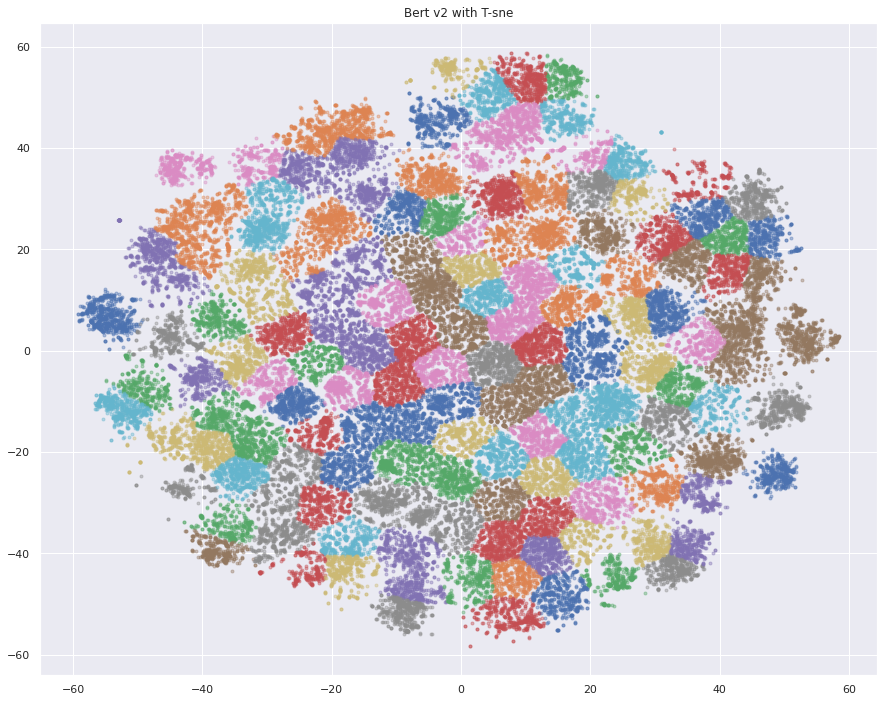

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(tsne_bert_embedding_v2,tsne_labels_bert_v2,"Bert v2 with T-sne")


In [ ]:
plt.savefig('images/BERT_T-sne_150.png')

<Figure size 432x288 with 0 Axes>

We can also visualize the Umap

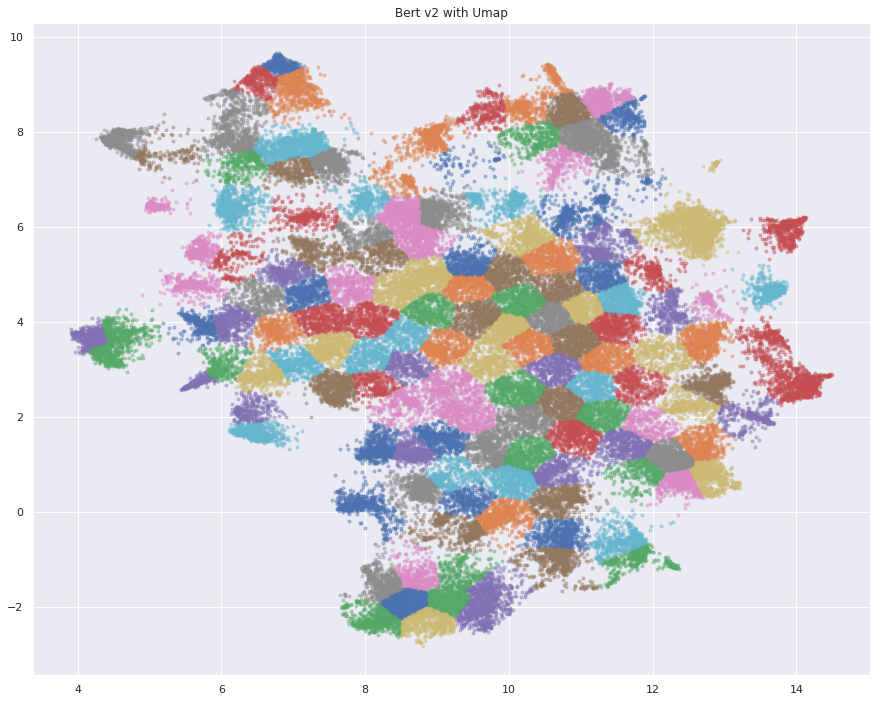

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(umap_bert_embedding_v2, umap_labels_bert_v2,"Bert v2 with Umap")

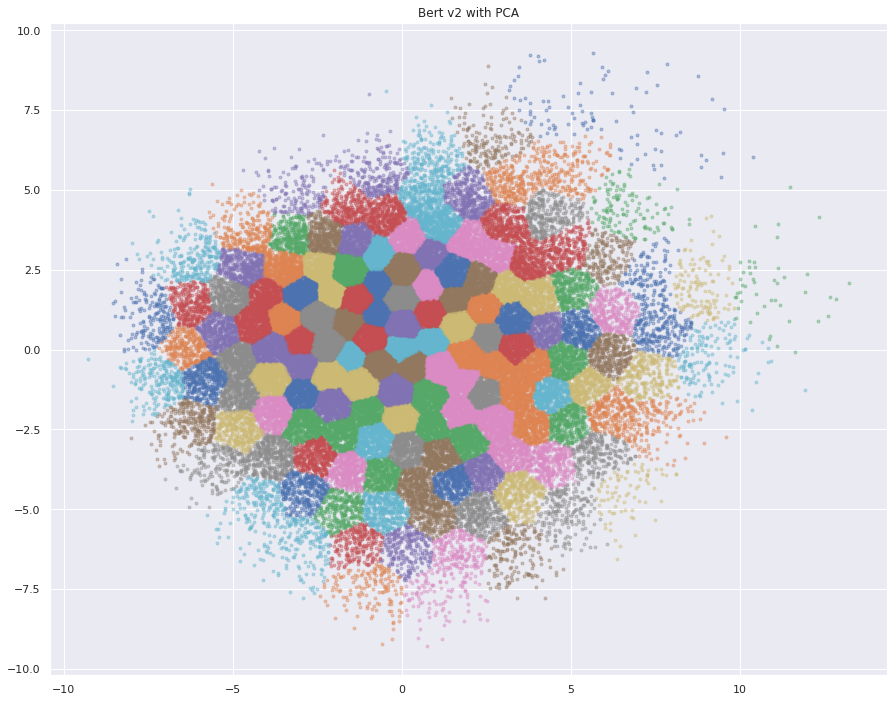

In [ ]:
plt.figure(figsize=(15, 12))
plot_embeddings(pca_bert_embedding_v2, pca_labels_bert_v2,"Bert v2 with PCA")

After modelling the topic of each text, we will proceed to perform text classification using the topic and the embedding.

In [ ]:
tsne_labels_bert[:25]

array([103,  91,  63,  74,  31, 145,  69,  27,   9, 106,   5,  56, 134,
        48,  80,  98, 145,  10,   0, 103, 111,  91,  69,  85,  78],
      dtype=int32)

In [ ]:
ngram_news['bert_umap_label'] = umap_labels_bert_v2

In [ ]:
ngram_news['Date'] = pd.to_datetime(ngram_news['Date'])
ngram_news.set_index('Date', inplace=True)

In [ ]:
ngram_news.to_csv('data/news_with_topic_label.csv', index=True)

### Relationship between News and Target

In [ ]:
topic_df = pd.read_csv('data/news_with_topic_label.csv')

In [ ]:
topic_df

,Date,News,ngrams,bert,bert_umap_label
0,2008-06-08,"b'Marriage, they said, was reduced to the stat...","['marriage', 'say', 'reduce', 'status', 'comme...","['marriage', 'say', 'reduce', 'status', 'comme...",51
1,2008-06-08,b'Nim Chimpsky: The tragedy of the chimp who t...,"['nim', 'chimpsky', 'tragedy', 'chimp', 'think...","['nim', 'chimpsky', 'tragedy', 'chimp', 'think...",14
2,2008-06-08,"b""Canada: Beware slippery slope' to censorship...","['canada', 'beware', 'slippery', 'slope', 'cen...","['canada', 'beware', 'slippery', 'slope', 'cen...",4
3,2008-06-08,b'EU Vice-President Luisa Morgantini and the I...,"['vice president', 'luisa', 'morgantini', 'iri...","['vice', 'president', 'luisa', 'morgantini', '...",64
4,2008-06-08,"b""Israeli minister: Israel will attack Iran if...","['israeli', 'minister', 'israel', 'attack iran...","['israeli', 'minister', 'israel', 'will', 'att...",145
...,...,...,...,...,...
73603,2016-07-01,"Venezuela, where anger over food shortages is ...","['venezuela', 'anger', 'food', 'shortage', 'mo...","['venezuela', 'where', 'anger', 'food', 'short...",139
73604,2016-07-01,A Hindu temple worker has been killed by three...,"['hindu temple', 'worker', 'kill', 'man', 'mot...","['hindu', 'temple', 'worker', 'kill', 'three',...",112
73605,2016-07-01,Ozone layer hole seems to be healing - US &amp...,"['ozone', 'layer', 'hole', 'healing', 'amp', '...","['ozone', 'layer', 'hole', 'seem', 'heal', 'am...",77
73606,2016-07-01,Taiwanese warship accidentally fires missile t...,"['taiwanese', 'warship', 'accidentally', 'fire...","['taiwanese', 'warship', 'accidentally', 'fire...",49


In [ ]:
labels_df = pd.DataFrame()
labels_df['topics'] = topic_df.groupby(['Date'])['bert_umap_label'].apply(list)
labels_df

,topics
Date,
2008-06-08,"[51, 14, 4, 64, 145, 23, 123, 70, 72, 23, 41, ..."
2008-06-09,"[109, 122, 39, 90, 65, 84, 37, 27, 9, 41, 24, ..."
2008-06-10,"[72, 24, 111, 27, 108, 86, 4, 4, 129, 40, 12, ..."
2008-06-11,"[110, 118, 118, 131, 39, 10, 27, 28, 149, 27, ..."
2008-06-12,"[88, 110, 129, 135, 88, 138, 52, 22, 139, 91, ..."
...,...
2016-06-27,"[128, 15, 75, 137, 122, 84, 148, 136, 65, 20, ..."
2016-06-28,"[17, 84, 130, 30, 108, 15, 148, 122, 52, 77, 1..."
2016-06-29,"[22, 82, 30, 41, 51, 119, 65, 88, 85, 125, 9, ..."


In [ ]:
cn_idx = list(combined_news.index.strftime('%Y-%m-%d'))
intersection = []
for idx, ts in tqdm(enumerate(list(labels_df.index))):
    if ts in cn_idx:
        intersection.append([idx, ts])

0it [00:00, ?it/s]

Get only rows appearing in the combined news.

In [ ]:
labels_df = labels_df.loc[[x[1] for x in intersection]]

In [ ]:
labels_df['Label'] = combined_news['Label']

In [ ]:
labels_df

,topics,Label
Date,,
2008-08-08,"[37, 48, 81, 141, 81, 81, 116, 14, 43, 52, 145...",0
2008-08-11,"[81, 81, 91, 81, 27, 81, 81, 141, 81, 27, 69, ...",1
2008-08-12,"[39, 113, 81, 143, 147, 81, 99, 81, 81, 81, 81...",0
2008-08-13,"[5, 81, 117, 5, 7, 81, 103, 94, 81, 145, 74, 1...",0
2008-08-14,"[137, 97, 5, 5, 54, 81, 5, 36, 5, 58, 117, 81,...",1
...,...,...
2016-06-27,"[128, 15, 75, 137, 122, 84, 148, 136, 65, 20, ...",0
2016-06-28,"[17, 84, 130, 30, 108, 15, 148, 122, 52, 77, 1...",1
2016-06-29,"[22, 82, 30, 41, 51, 119, 65, 88, 85, 125, 9, ...",1


In [ ]:
aux = pd.DataFrame(columns=[x for x in range(150)])
for ix in tqdm(range(len(labels_df))):
    aux.loc[ix] = Counter(labels_df['topics'].iloc[ix])
aux = aux.fillna(0)
aux.index= labels_df.index

  0%|          | 0/1989 [00:00<?, ?it/s]

In [ ]:
encoded_topics_df = pd.concat([labels_df, aux], axis=1)

In [ ]:
encoded_topics_df.drop('topics', axis=1, inplace=True)

In [ ]:
encoded_topics_df

,Label,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-08-08,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,0,0,0,0
2008-08-11,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0
2008-08-12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,...,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2008-08-13,0,0,0,0,0,0,4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2008-08-14,1,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-06-27,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0
2016-06-28,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,2,0,1,0,1,0,0,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0
2016-06-29,1,0,0,0,0,0,0,0,0,1,3,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
encoded_topics_df.to_csv('data/encoded_topics_df.csv')

#### Visualize Correlations betwen News Topic and Label

In [ ]:
corr = encoded_topics_df.corr()

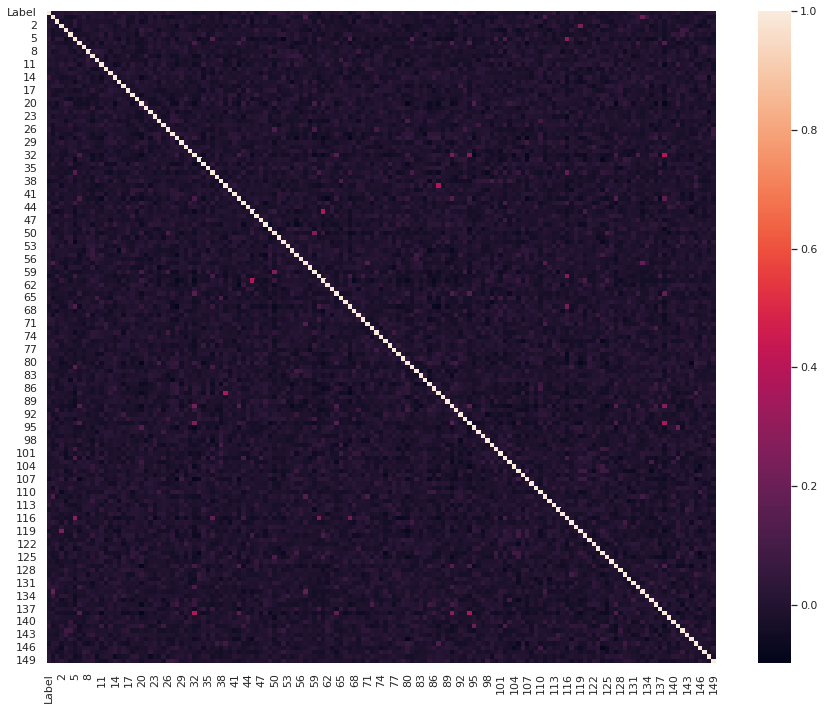

In [ ]:
plt.figure(figsize=(15, 12))
sns.heatmap(corr)

In [ ]:
vs_label_corr = corr.loc['Label'].abs().sort_values(kind="quicksort",ascending=False)
pd.DataFrame(vs_label_corr).head(15).iloc[1:].style.background_gradient(cmap='Blues')  # iloc[0] is Label

,Label
107,0.055404
38,0.050925
79,0.050750
14,0.048739
60,0.047759
113,0.047651
57,0.045222
43,0.042622
51,0.041464
32,0.041012


### Visualize Meta-Features when the stock goes up vs when it goes down

Features such as: polarity, readability and reading_time.

We will plot their according plots. To check for these metrics, we will use the version of news we used to train the _Bert_ model, since is the one we have modified least and will pressumibly give better metrics on readability. When it comes to word frequencies when market goes up and down, we will use the _ngram_ dataset, since it will allow our model to take into account _north korea_ as a word and not as two different words. Hence, being more insightful.

#### Build Meta-Features

In [ ]:
df = pd.read_csv('data/news_with_topic_label.csv')

Load ngrams as sentences:

In [ ]:
combined_news ['Date_str'] = combined_news.index

In [ ]:
combined_news['Date_str'] = combined_news['Date_str'].astype(str)

In [ ]:
lab_df = df.merge(pd.DataFrame(combined_news), left_on='Date', right_on='Date_str')
lab_df = lab_df[lab_df.columns.drop(list(lab_df.filter(regex='Top')))]
lab_df.drop('Date_str', axis=1, inplace=True)
lab_df

,Date,News,ngrams,bert,bert_umap_label,Label
0,2008-08-08,b'Georgian troops retreat from S. Osettain cap...,"['georgian', 'troop', 'retreat', 'osettain', '...","['georgian', 'troop', 'retreat', 'osettain', '...",37,0
1,2008-08-08,"b""The 'enemy combatent' trials are nothing but...","['enemy', 'combatent', 'trial', 'sham', 'salim...","['enemy', 'combatent', 'trial', 'sham', 'salim...",48,0
2,2008-08-08,"b""Breaking: Georgia invades South Ossetia, Rus...","['break', 'georgia', 'south ossetia', 'russia'...","['break', 'georgia', 'south', 'ossetia', 'russ...",81,0
3,2008-08-08,b'150 Russian tanks have entered South Ossetia...,"['russian', 'tank', 'enter', 'south ossetia', ...","['russian', 'tank', 'enter', 'south', 'ossetia...",141,0
4,2008-08-08,b'Did the U.S. Prep Georgia for War with Russia?',"['prep', 'georgia', 'war', 'russia']","['prep', 'georgia', 'war', 'russia']",81,0
...,...,...,...,...,...,...
49713,2016-07-01,"Venezuela, where anger over food shortages is ...","['venezuela', 'anger', 'food', 'shortage', 'mo...","['venezuela', 'where', 'anger', 'food', 'short...",139,1
49714,2016-07-01,A Hindu temple worker has been killed by three...,"['hindu temple', 'worker', 'kill', 'man', 'mot...","['hindu', 'temple', 'worker', 'kill', 'three',...",112,1
49715,2016-07-01,Ozone layer hole seems to be healing - US &amp...,"['ozone', 'layer', 'hole', 'healing', 'amp', '...","['ozone', 'layer', 'hole', 'seem', 'heal', 'am...",77,1
49716,2016-07-01,Taiwanese warship accidentally fires missile t...,"['taiwanese', 'warship', 'accidentally', 'fire...","['taiwanese', 'warship', 'accidentally', 'fire...",49,1


In [ ]:
# import ast
# s = [" ".join(ast.literal_eval(sent)) for sent in lab_df['ngrams']]
# lab_df['sents'] = s

In [ ]:
# remove just unicode marks, since it is better for bert to have full context.
base_news = lab_df.News.tolist()
base_news = [re.sub(r'\bsay\S+\b', '', nw) for nw in base_news]

# remove emails, newlines and single quotes
base_news = [re.sub(r'\s+', ' ', nw) for nw in base_news]
base_news = [re.sub(r'\S*@\S*\s?', '', nw) for nw in base_news]

# remove traces of byte strings: b' or b"
base_news = [re.sub(r"b\'", "", nw) for nw in base_news]
base_news = [re.sub(r'b\"', "", nw) for nw in base_news]

# remove quoting
base_news = [re.sub(r"\'", "", nw) for nw in base_news]

lab_df['base_news'] = base_news

In [ ]:
from textblob import TextBlob
!pip install -q textstat
import textstat

In [ ]:
lab_df['Polarity'] = lab_df['base_news'].apply(lambda x: TextBlob(x).sentiment.polarity)
# readablity indices
lab_df['dale_chall_score']=lab_df['base_news'].apply(lambda x: textstat.dale_chall_readability_score(x))
lab_df['flesh_reading_ease']=lab_df['base_news'].apply(lambda x: textstat.flesch_reading_ease(x))
lab_df['gunning_fog']=lab_df['base_news'].apply(lambda x: textstat.gunning_fog(x))
# reading time
lab_df['reading_time']=lab_df['base_news'].apply(lambda x: textstat.reading_time(x))


In [ ]:
lab_df.to_csv('data/lab_df.csv')

#### Top (n-)grams when market goes up vs when it goes down

Get news when market goes up and down

In [ ]:
up_words = lab_df[lab_df['Label'] == 1]['ngrams']
down_words = lab_df[lab_df['Label'] == 0]['ngrams']

All n-grams in a list when market goes up and down

In [ ]:
up_list = [word for sublist in up_words for word in  ast.literal_eval(sublist)]
down_list = [word for sublist in down_words for word in  ast.literal_eval(sublist)]

Count occurrences of each word when market goes up and down

In [ ]:
up_wcounter = Counter(up_list)
down_wcounter = Counter(down_list)

Get the top30:

In [ ]:
up_top_30 = pd.DataFrame(up_wcounter.most_common(30), columns=['word', 'count'])
down_top_30 = pd.DataFrame(down_wcounter.most_common(30), columns=['word', 'count'])

#### Get the top 30 when the DJIA goes up

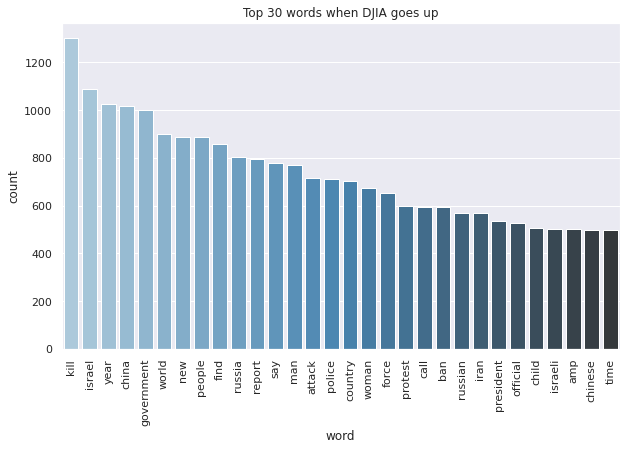

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x='word', y='count', data=up_top_30, ax=ax, palette='Blues_d')
plt.title('Top 30 words when DJIA goes up')
plt.xticks(rotation='vertical');


#### Top 30 News when the DJIA goes down

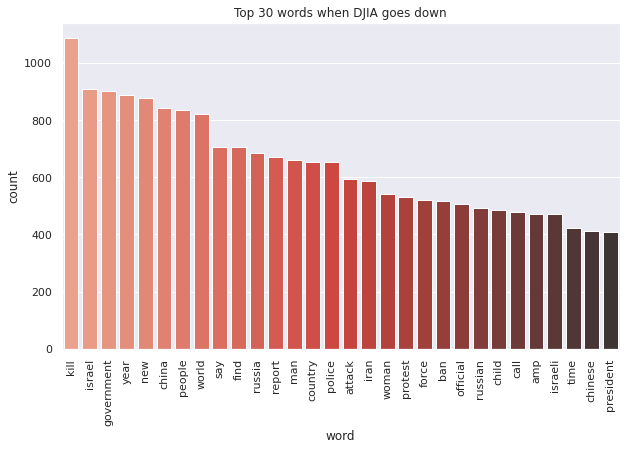

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x='word', y='count', data=down_top_30, ax=ax, palette='Reds_d')
plt.title('Top 30 words when DJIA goes down')
plt.xticks(rotation='vertical');

#### WordCloud when market goes up

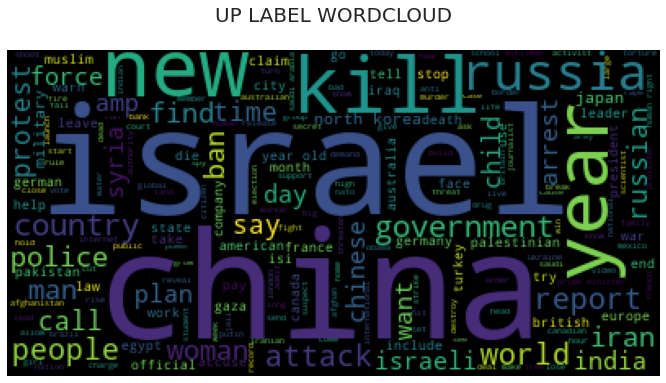

In [ ]:
plt.figure(figsize=(12,6))
text = ' '.join(up_list)
wc = WordCloud(background_color='black').generate(text)
plt.title("UP LABEL WORDCLOUD\n", fontsize=20)
plt.axis('off')
plt.imshow(wc);

#### WordCloud when market goes down

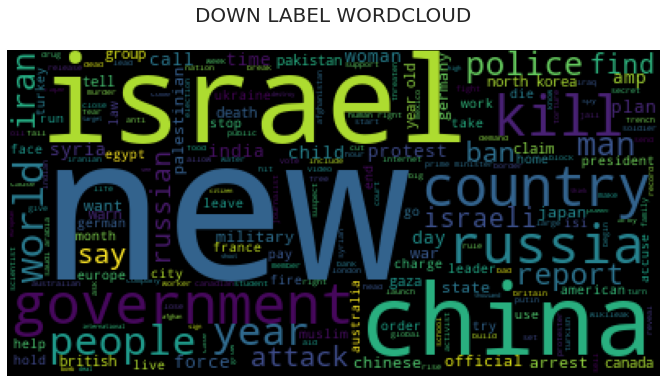

In [ ]:
plt.figure(figsize=(12,6))
text = ' '.join(down_list)
wc = WordCloud(background_color='black').generate(text)
plt.title("DOWN LABEL WORDCLOUD\n", fontsize=20)
plt.axis('off')
plt.imshow(wc);

#### Unique Ngrams when the market goes up vs when it goes down

In [ ]:
lab_df = pd.read_csv('data/lab_df.csv')

In [ ]:
from src.nlp_utils.eda_meta_features import words_unique

In [ ]:
raw_text = [word for word_list in lab_df['ngrams'] for word in ast.literal_eval(word_list)]

In [ ]:
unique_up = words_unique(lab_df, 1, 20, raw_text, 'ngrams')

###### Up market only ngrams

In [ ]:
print("The top 20 unique words when stock goes up are:")
unique_up[:20].style.background_gradient(cmap='Greens')

The top 20 unique words when stock goes up are:


,words,count
0,peace deal,12
1,sudden,10
2,stay home,9
3,aipac,9
4,manning,9
5,riyadh,9
6,fishermen,8
7,nokia,8
8,cricket,8
9,rumble,8


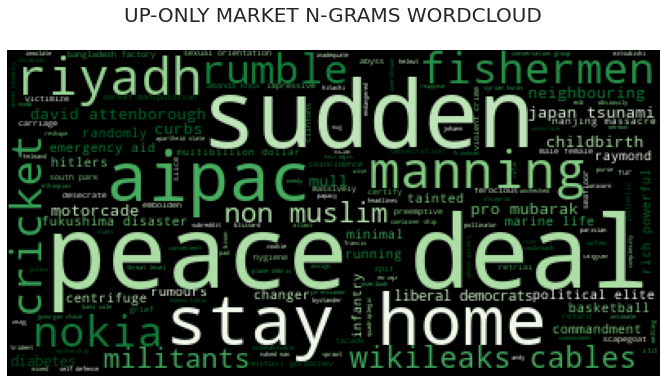

In [ ]:
plt.figure(figsize=(12,6))
freq_dict = dict(zip(unique_up.words, unique_up.eval('count')))
wc = WordCloud(background_color='black', colormap='Greens_r').generate_from_frequencies(frequencies=freq_dict)
plt.title("UP-ONLY MARKET N-GRAMS WORDCLOUD\n", fontsize=20)
plt.axis('off')
plt.imshow(wc);

##### Down market only ngrams

In [ ]:
unique_down = words_unique(lab_df, 0, 20, raw_text, 'ngrams')

In [ ]:
print("The top 20 unique words when stock goes down are:")
unique_down[:20].style.background_gradient(cmap='Reds')

The top 20 unique words when stock goes down are:


,words,count
0,pier,8
1,iraq inquiry,8
2,windows,7
3,wetland,7
4,fifa corruption,7
5,burkina faso,7
6,month low,6
7,hatch,6
8,ski,6
9,norwegian doctor,6


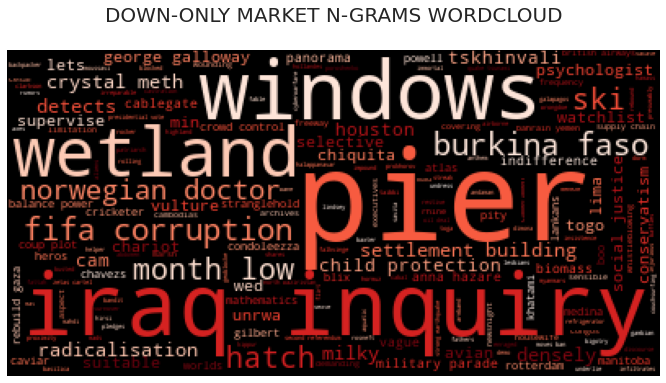

In [ ]:
plt.figure(figsize=(12,6))
freq_dict = dict(zip(unique_down.words, unique_down.eval('count')))  # eval to access Counter column values
wc = WordCloud(background_color='black', colormap='Reds_r').generate_from_frequencies(frequencies=freq_dict)
plt.title("DOWN-ONLY MARKET N-GRAMS WORDCLOUD\n", fontsize=20)
plt.axis('off')
plt.imshow(wc);

#### Kdeplot of Polarity

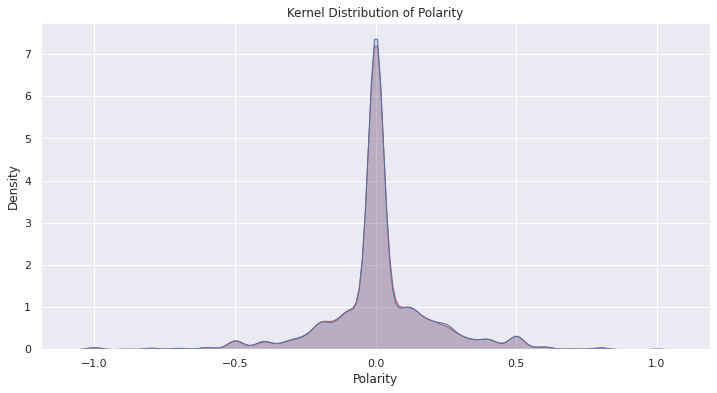

In [ ]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].Polarity, shade=True, color="r").set_title('Kernel Distribution of Polarity')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].Polarity, shade=True, color="b")

Since both distributions look pretty much identical, we will take a closer look at the tails, since there is where we should find greater differences.

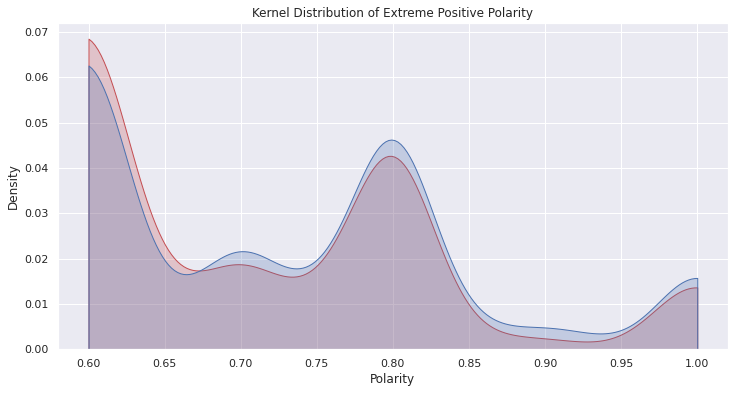

In [ ]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].Polarity, shade=True, color="r", clip=(0.6, 1)).set_title('Kernel Distribution of Extreme Positive Polarity')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].Polarity, shade=True, color="b", clip=(0.6, 1))

We see that after $0.65$ of polarity, Upper trends in stock market tend to be more abundant. Not as much as expected, however.

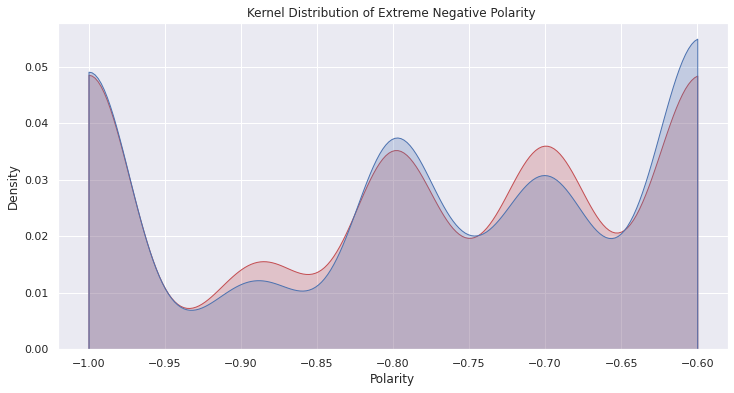

In [ ]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].Polarity, shade=True, color="r", clip=(-0.6, -1)).set_title('Kernel Distribution of Extreme Negative Polarity ')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].Polarity, shade=True, color="b", clip=(-0.6, -1))

We see that it is not until $-0.65$ of polarity that we don't see a clear difference in density of down-trend labels. However, around $0.8$, upper trends predominate. After that, about the $-0.85$ range, down-trend dominates and finally, the left tail overlaps both up and down trends.

#### Kdeplot of Readibility features


In [9]:
lab_df = pd.read_csv('data/lab_df.csv')

In [10]:
lab_df.columns

Index(['Unnamed: 0', 'Date', 'News', 'ngrams', 'bert', 'bert_umap_label',
       'Label', 'base_news', 'Polarity', 'dale_chall_score',
       'flesh_reading_ease', 'gunning_fog', 'reading_time'],
      dtype='object')

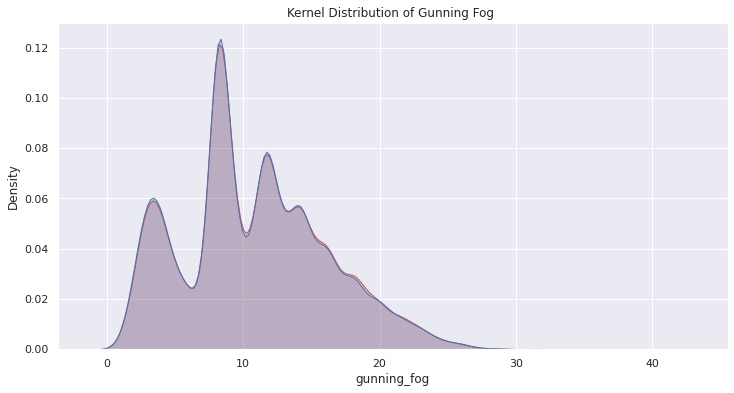

In [16]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].gunning_fog, shade=True, color="r").set_title('Kernel Distribution of Gunning Fog ')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].gunning_fog, shade=True, color="b")

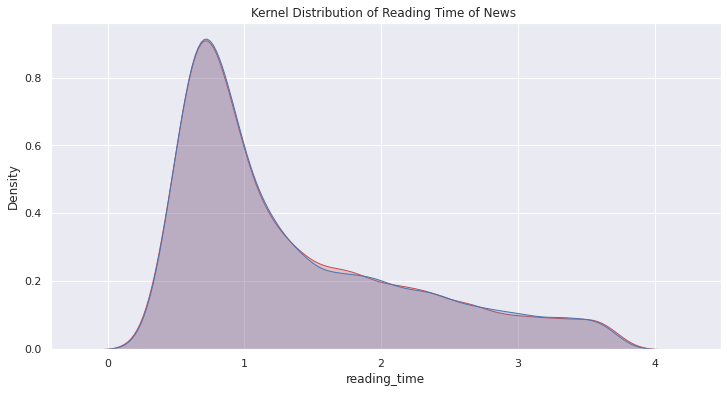

In [17]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].reading_time, shade=True, color="r").set_title('Kernel Distribution of Reading Time of News ')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].reading_time, shade=True, color="b")

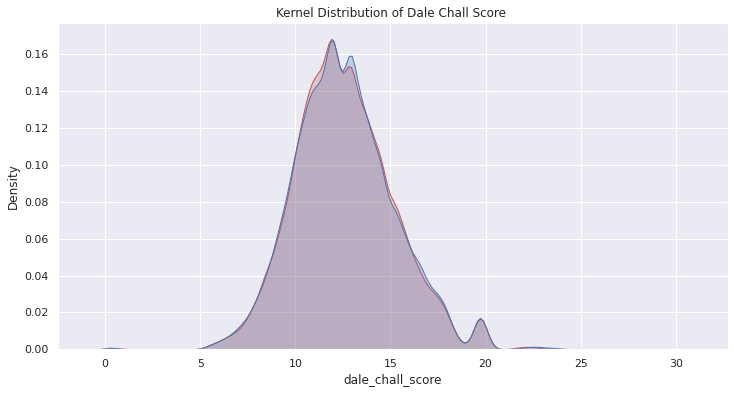

In [18]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].dale_chall_score, shade=True, color="r").set_title('Kernel Distribution of Dale Chall Score ')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].dale_chall_score, shade=True, color="b")

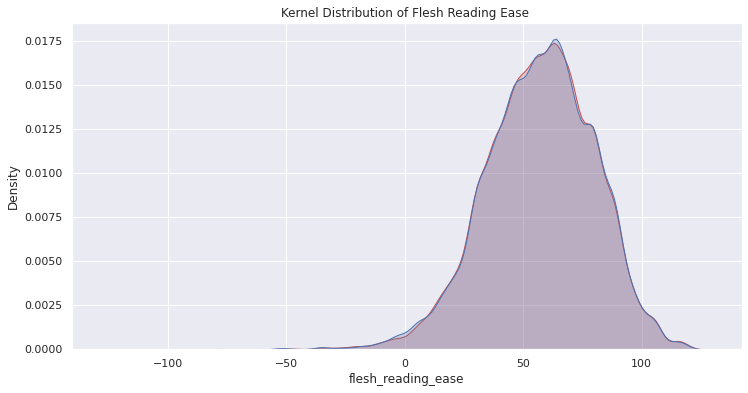

In [19]:
plt.figure(figsize=(12,6))

p1=sns.kdeplot(lab_df[lab_df.Label == 0].flesh_reading_ease, shade=True, color="r").set_title('Kernel Distribution of Flesh Reading Ease ')
p1=sns.kdeplot(lab_df[lab_df.Label == 1].flesh_reading_ease, shade=True, color="b")

To sum up, we got BERT with Umap as the best embedder to classify news topics with which we built a dataframe with the main news topics of each day and, finally, we got some features from our text depending on the label, such as: polarity and ease of read.

## Time Series EDA

#### Check Dimensions of the Dataset

In [9]:
djia_ts.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1989 entries, 2016-07-01 to 2008-08-08
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1989 non-null   float64
 1   High       1989 non-null   float64
 2   Low        1989 non-null   float64
 3   Close      1989 non-null   float64
 4   Volume     1989 non-null   int64  
 5   Adj Close  1989 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 108.8 KB


We have $1989$ entries from $2008$ to $2016$. Let's preview the dataset.

In [10]:
djia_ts.head(5)

,Open,High,Low,Close,Volume,Adj Close
Date,,,,,,
2016-07-01,17924.240234,18002.380859,17916.910156,17949.369141,82160000,17949.369141
2016-06-30,17712.759766,17930.609375,17711.800781,17929.990234,133030000,17929.990234
2016-06-29,17456.019531,17704.509766,17456.019531,17694.679688,106380000,17694.679688
2016-06-28,17190.509766,17409.720703,17190.509766,17409.720703,112190000,17409.720703
2016-06-27,17355.210938,17355.210938,17063.080078,17140.240234,138740000,17140.240234


The first entries of the dataset are the ones from $2016$, which might not be convinient later, since it could cause a big problem of data leackage. Let's revert the order of the series, so it follows chronological order.

In [9]:
djia_ts = djia_ts[::-1]
djia_ts.head(5)

,Open,High,Low,Close,Volume,Adj Close
Date,,,,,,
2008-08-08,11432.089844,11759.959961,11388.040039,11734.320312,212830000,11734.320312
2008-08-11,11729.669922,11867.110352,11675.530273,11782.349609,183190000,11782.349609
2008-08-12,11781.700195,11782.349609,11601.519531,11642.469727,173590000,11642.469727
2008-08-13,11632.809570,11633.780273,11453.339844,11532.959961,182550000,11532.959961
2008-08-14,11532.070312,11718.280273,11450.889648,11615.929688,159790000,11615.929688


Now that we have our dataset in the proper order, let's moeve on to null value detection.

#### Null Value Detection

We will first check we have no NaNs in our dataset.

In [12]:
djia_ts.isna().sum()

Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64

We have no null values, we are good to go with further exploration of our time series.

#### View simple statistics on the time series

In [13]:
djia_ts.describe()

,Open,High,Low,Close,Volume,Adj Close
count,1989.000000,1989.000000,1989.000000,1989.000000,1.989000e+03,1989.000000
mean,13459.116048,13541.303173,13372.931728,13463.032255,1.628110e+08,13463.032255
std,3143.281634,3136.271725,3150.420934,3144.006996,9.392343e+07,3144.006996
min,6547.009766,6709.609863,6469.950195,6547.049805,8.410000e+06,6547.049805
25%,10907.339844,11000.980469,10824.759766,10913.379883,1.000000e+08,10913.379883
50%,13022.049805,13088.110352,12953.129883,13025.580078,1.351700e+08,13025.580078
75%,16477.699219,16550.070312,16392.769531,16478.410156,1.926000e+08,16478.410156
max,18315.060547,18351.359375,18272.560547,18312.390625,6.749200e+08,18312.390625


#### DJIA Candlestick Chart

In [14]:
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot # plotly offline mode

# create two subplots
fig = make_subplots(rows=2, cols=1, row_heights=(0.7, 0.3)) #, specs=[[{"secondary_y": True}]])

# add candlesticks
fig.add_trace(go.Candlestick(
    x=djia_ts.index,
    open=djia_ts.Open,
    high=djia_ts.High,
    low=djia_ts.Low,
    close=djia_ts.Close,
    name="DJIA Price"
    ), 
    row=1, col=1)

# add volume as secondary plot
fig.add_trace(go.Bar(
    x=djia_ts.index, 
    y=djia_ts.Volume,
    name="Volume",
    opacity=1,

    ), 
    row=2, col=1)

fig.update_layout(xaxis_rangeslider_visible=False)

fig.update_layout(
    title="DJIA (2008-2016)",
    xaxis2_title="Year",
    yaxis_title="Price ($)",
    yaxis2_title="Volume",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ),
    margin=go.layout.Margin(
        b=10,
        l=40
    ),
    xaxis_showticklabels=False
)
fig.layout.yaxis.showgrid=False
fig.layout.yaxis2.showgrid=False
iplot(fig)
# fig.show()

#### Decomposition of the DJIA time series

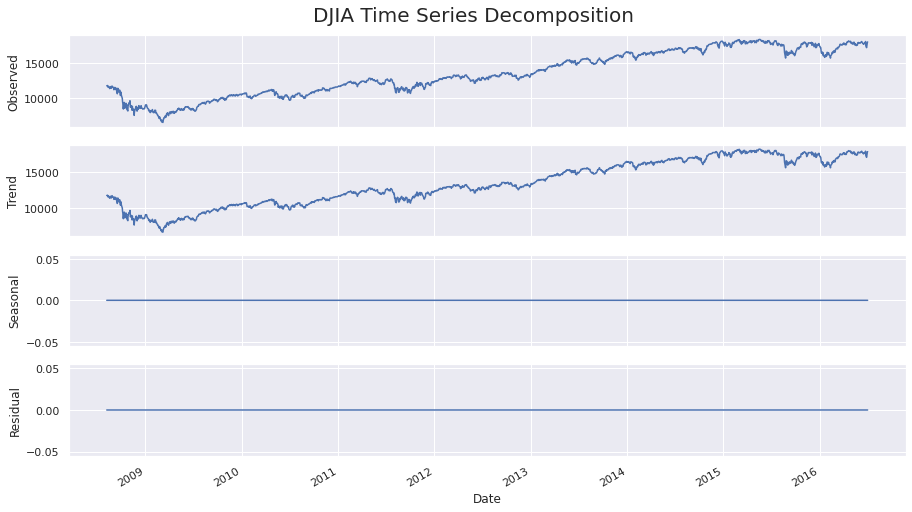

In [15]:
res = seasonal_decompose(djia_ts['Adj Close'], model='additive', freq=1, )
fig, (ax0, ax1,ax2,ax3) = plt.subplots(4,1, figsize=(15,8))
plt.suptitle("DJIA Time Series Decomposition", fontsize=20)
res.observed.plot(ax=ax0, ylabel="Observed")
res.trend.plot(ax=ax1, sharex=ax0, ylabel="Trend")
res.seasonal.plot(ax=ax2, sharex=ax0, ylabel="Seasonal")
res.resid.plot(ax=ax3, sharex=ax0, ylabel="Residual")
fig.subplots_adjust(top=0.93)
plt.plot();

#### Rolling Moving Averages of the price

In [11]:
ind_ts = djia_ts.copy(deep=True)
mavgs = [12, 50, 200]
for ma in mavgs:
    mavg_col = f"MA{ma}"
    ind_ts[mavg_col] = ind_ts['Adj Close'].rolling(ma, min_periods=1).mean()

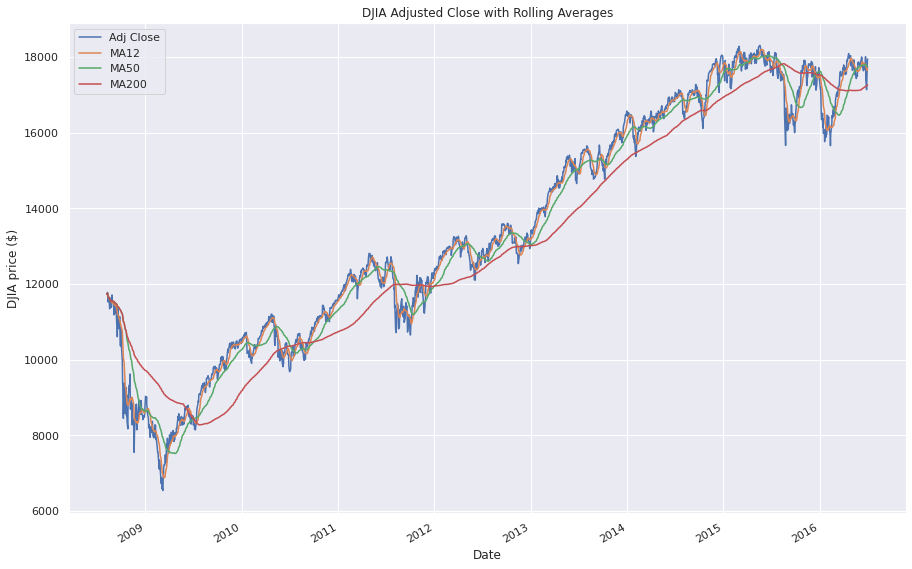

In [12]:

cols = ['Adj Close']
cols.extend([f"MA{ma}" for ma in mavgs])

# fig = plt.figure()
# fig.suptitle(t='DJIA Adjusted Close with Rolling Averages', fontsize=20)
# fig.subplots_adjust(top=0.94)
ind_ts[cols].plot(
    title='DJIA Adjusted Close with Rolling Averages',
    figsize=(15, 10), 
    ylabel='DJIA price ($)');
# plt.show(fig)


The $200$ rolling average shows the clear up trend of the market from $2009$ to $2015$.

#### Daily Return

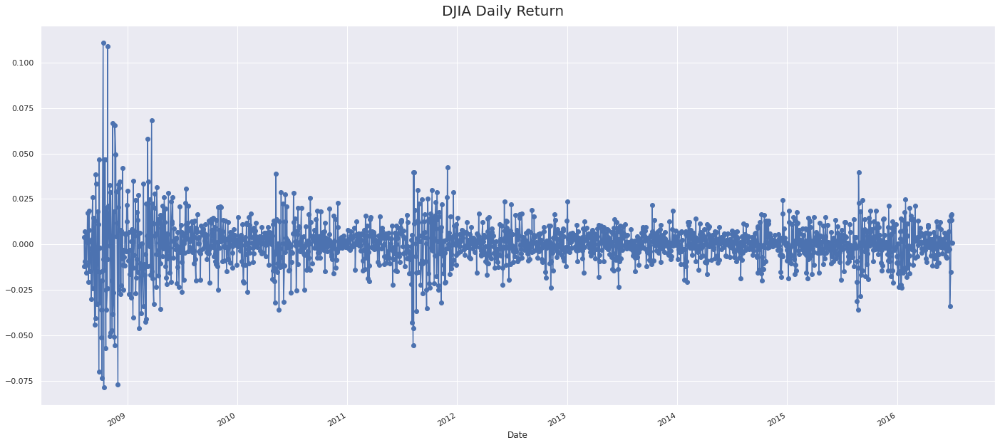

In [13]:
fig = plt.figure()
ind_ts['Returns'] = ind_ts['Adj Close'].pct_change()
ind_ts['Returns'].plot(
    marker='o', 
    linestyle='-', 
    figsize=(24, 10));
fig.suptitle(t='DJIA Daily Return', fontsize=20)
fig.subplots_adjust(top=0.94)

Lots of volatility in $2009$, after that, pretty much a constant volatility, except for the end of $2011$.

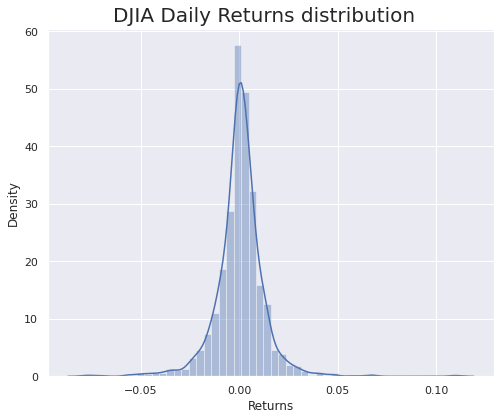

In [21]:
fig = plt.figure(figsize=(8, 6))
sns.distplot(ind_ts['Returns'])
fig.suptitle(t='DJIA Daily Returns distribution', fontsize=20)
fig.subplots_adjust(top=0.93);

Unimodal, centered at 0, more returns on the positive side, but more outliers on the negative side.

### TS Feature Engineering

### Fractional differentiation

From our EDA, we discoverd that our time series had an important trend, so we should take care of it by differencing our time series. This way, our models will be able to extract more information from the price. 

There are main ways usually are: either log-difference the series, just log the series or just difference the series. The problem with this approach is that the memory from the time series is removed and hence, most of the information. To tackle that problem, we can build fractinal differentiation. That is, we will do just differentiation up until the point is needed. Otherwise, we would be overdifferentiating. This way, we will be able to keep some memory while having a perfectly differentiated and stationary series. We will apply that to our Adj Close, since is the main factor we are going to use to predict whether we have to buy or sell the next day.

We will first fractionally differentiate our series, and then will get the rest of indicators.

##### Full differentiation

In [19]:
from statsmodels.tsa.stattools import adfuller  # check for stationarity

In few words, unless we reject the null hypothesis of the dickey fuller test, we cannot say our series is stationary. 

In [20]:
def adftest(df, col=None):
    try:
        adf_test = adfuller(df[col])
    except:
        adf_test = adfuller(df)
    print(f"ADF Statistic: {adf_test[0]}")
    print(f"ADF p-value: {adf_test[1]}")

In [21]:
# Non differentiated series adf test:
adftest(ind_ts, 'Adj Close')

ADF Statistic: -0.374712751297352
ADF p-value: 0.9142360000847205


p-value not enough to reject the null hypothesis, we reject stationarity.

In [35]:
# log the series
ind_ts['Log_Adj_Close'] = np.log(ind_ts['Adj Close'])
adftest(ind_ts, 'Log_Adj_Close')

ADF Statistic: -0.5239962922444568
ADF p-value: 0.8872481071065026


p-value not enough to reject the null hypothesis, we reject stationarity.

In [23]:
# differentiate the series
returns = ind_ts['Adj Close'] - ind_ts['Adj Close'].shift(1)
returns.dropna(inplace=True)
adftest(returns)

ADF Statistic: -10.116266557170398
ADF p-value: 9.706086912817664e-18


Finally, our p-value is low enough to reject our null hypothesis and hence, the series is stationary. However, the p-value is 0.0, we might have overdifferentiated our series, as we stated at the beginning of the section. Let's try fractional differentiation.

##### Fractional Differentiation

In [15]:
from src.ts_utils import frac_diff

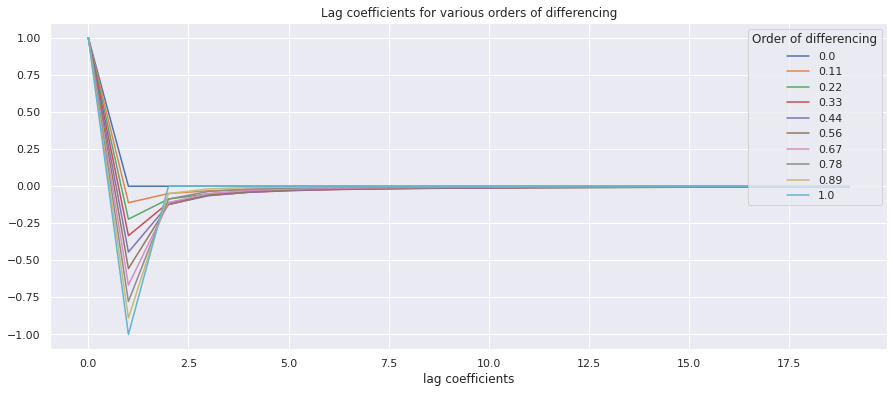

In [14]:
frac_diff.plotWeights([0, 1], 20, 10)

Now that we have experimented, let's look at which is the degree of differentiation needed for our time series

In [141]:
range_d = np.divide(range(1, 200), 200)
thres = 1e-3  # p-value threshold 
# if we had a longer time series, a lower threshold would be selected

base_close_adf = [None]*len(range_d)
log_close_adf = [None]*len(range_d)

for i in tqdm(range(len(range_d))):
    base_close_adf[i] = adfuller(
                            frac_diff.frac_diff_ffd(
                                ind_ts['Adj Close'], 
                                range_d[i]),
                            )[1]

    log_close_adf[i] = adfuller(
                            frac_diff.frac_diff_ffd(
                                ind_ts['Log_Adj_Close'], 
                                range_d[i]),
                            )[1]


  0%|          | 0/199 [00:00<?, ?it/s]

Visualize the p-values

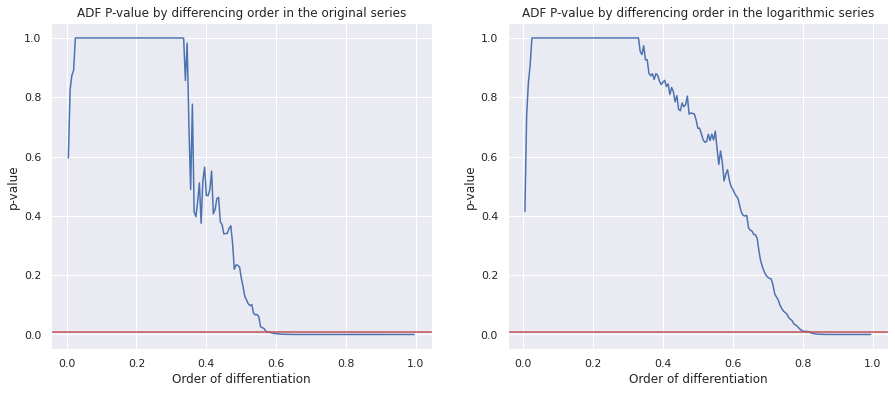

In [139]:
fig, ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(range_d, 
           # drop nans from p-values and replace with 1
           [x if str(x) != 'nan' else 1 for x in base_close_adf ]
           ) 
ax[0].axhline(y=0.01,color='r')
ax[0].set_title('ADF P-value by differencing order in the original series')
ax[0].set_xlabel('Order of differentiation')
ax[0].set_ylabel('p-value')
ax[1].plot(range_d,
           # drop nans from p-values and replace with 1
           [x if str(x) != 'nan' else 1 for x in log_close_adf ]
           )
ax[1].axhline(y=0.01,color='r')
ax[1].set_title('ADF P-value by differencing order in the logarithmic series')
ax[1].set_xlabel('Order of differentiation')
ax[1].set_ylabel('p-value');

We see that there is no need to reach a full differentiation in order to have a stationary series according to the ADF test. In the case of the original series + frac differentiation, we need around 0.6 and when using log prices, around a 0.8. Hence, we will use the first one (the original series + frac diff at 0.6), since it will provide us with more memory.

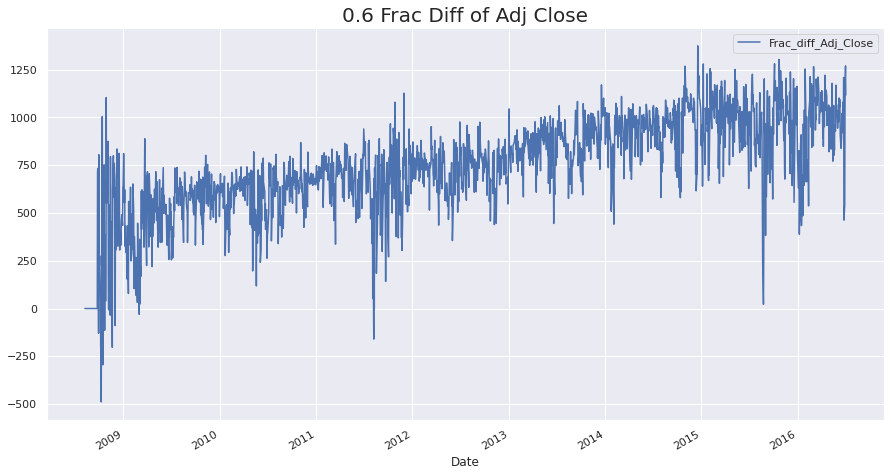

In [16]:
fig, ax = plt.subplots(figsize=(15, 8))
ind_ts['Frac_diff_adjClose'] = frac_diff.frac_diff_ffd(ind_ts['Adj Close'], 0.6, thres=1e-3)
ind_ts['Frac_diff_adjClose'].plot(ax=ax)
ax.legend(['Frac_diff_Adj_Close'])
plt.title('0.6 Frac Diff of Adj Close', fontsize=20);

In [191]:
adftest(frac_diff.frac_diff_ffd(ind_ts['Adj Close'], 0.6, thres=1e-3))

ADF Statistic: -3.647035106905193
ADF p-value: 0.004922930501520096


p-value of $0.005$, more than enough to say the series is stationary with high confidence.

In [26]:
ind_ts['Adj Close'].corr(ind_ts['Frac_diff_adjClose'])

0.7566314102818685

Even after differencing, we keep about $75\%$ correlation with the original series, which is much  more than what we would have got from integer differentiation.

There can be made improvements in the implementation as stated by:
[RAPIDS-AI](https://medium.com/rapids-ai/rapid-fractional-differencing-to-minimize-memory-loss-while-making-a-time-series-stationary-2052f6c060a4), which discusses a GPU implementation for better results.

Credits to the Fractional Differentiation to: 
* Marcos Lopez de Prado, Advances in Financial Machine Learning
* Hosking for his paper in 1981 on fractional differencing.


#### Market Features

In [17]:
from src.ts_utils import indicators

In [18]:
indicators_df = indicators.add_indicators(ind_ts)

In [20]:
indicators_df.head(5)

,Open,High,Low,Close,Volume,Adj Close,MA12,MA50,MA200,Returns,Frac_diff_adjClose,EMA10,EMA50,EMA200,ROC10,ROC30,MOM10,MOM30,RSI10,RSI30,RSI200,%K10,%D10,%K30,%D30,%K200,%D200,ULTOSC,ADX7,ADX14,ADX21
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-08-08,11432.089844,11759.959961,11388.040039,11734.320312,212830000,11734.320312,11734.320312,11734.320312,11734.320312,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-11,11729.669922,11867.110352,11675.530273,11782.349609,183190000,11782.349609,11758.334961,11758.334961,11758.334961,0.004093,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-12,11781.700195,11782.349609,11601.519531,11642.469727,173590000,11642.469727,11719.713216,11719.713216,11719.713216,-0.011872,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-13,11632.809570,11633.780273,11453.339844,11532.959961,182550000,11532.959961,11673.024902,11673.024902,11673.024902,-0.009406,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-14,11532.070312,11718.280273,11450.889648,11615.929688,159790000,11615.929688,11661.605859,11661.605859,11661.605859,0.007194,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


After adding the indicators to our dataset, we got a fair amount of NaNs, let's fill them with the mean value. We will replace them by their mean

In [22]:
for col in indicators_df:
    indicators_df[col].fillna(indicators_df[col].mean(), inplace=True)

Finally, we will add the label to predict.

In [25]:
indicators_df['Label'] = combined_news.Label

In [32]:
indicators_df

,Open,High,Low,Close,Volume,Adj Close,MA12,MA50,MA200,Returns,Frac_diff_adjClose,EMA10,EMA50,EMA200,ROC10,ROC30,MOM10,MOM30,RSI10,RSI30,RSI200,%K10,%D10,%K30,%D30,%K200,%D200,ULTOSC,ADX7,ADX14,ADX21,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-08-08,11432.089844,11759.959961,11388.040039,11734.320312,212830000,11734.320312,11734.320312,11734.320312,11734.320312,0.000294,0.000000,13457.487342,13435.059719,13477.830352,0.272382,0.842185,30.979152,97.215345,54.302034,53.295405,52.019476,60.484548,60.463046,64.884414,64.863643,78.779063,78.750858,55.378854,33.218738,23.038855,18.780034,0
2008-08-11,11729.669922,11867.110352,11675.530273,11782.349609,183190000,11782.349609,11758.334961,11758.334961,11758.334961,0.004093,0.000000,13457.487342,13435.059719,13477.830352,0.272382,0.842185,30.979152,97.215345,54.302034,53.295405,52.019476,60.484548,60.463046,64.884414,64.863643,78.779063,78.750858,55.378854,33.218738,23.038855,18.780034,1
2008-08-12,11781.700195,11782.349609,11601.519531,11642.469727,173590000,11642.469727,11719.713216,11719.713216,11719.713216,-0.011872,0.000000,13457.487342,13435.059719,13477.830352,0.272382,0.842185,30.979152,97.215345,54.302034,53.295405,52.019476,60.484548,60.463046,64.884414,64.863643,78.779063,78.750858,55.378854,33.218738,23.038855,18.780034,0
2008-08-13,11632.809570,11633.780273,11453.339844,11532.959961,182550000,11532.959961,11673.024902,11673.024902,11673.024902,-0.009406,0.000000,13457.487342,13435.059719,13477.830352,0.272382,0.842185,30.979152,97.215345,54.302034,53.295405,52.019476,60.484548,60.463046,64.884414,64.863643,78.779063,78.750858,55.378854,33.218738,23.038855,18.780034,0
2008-08-14,11532.070312,11718.280273,11450.889648,11615.929688,159790000,11615.929688,11661.605859,11661.605859,11661.605859,0.007194,0.000000,13457.487342,13435.059719,13477.830352,0.272382,0.842185,30.979152,97.215345,54.302034,53.295405,52.019476,60.484548,60.463046,64.884414,64.863643,78.779063,78.750858,55.378854,33.218738,23.038855,18.780034,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-06-27,17355.210938,17355.210938,17063.080078,17140.240234,138740000,17140.240234,17690.713379,17777.304648,17239.533599,-0.014971,540.938744,17634.490713,17681.285063,17405.267821,-3.339861,-2.253053,-592.240235,-395.080078,29.440827,42.079879,49.813931,38.307436,55.939672,39.183586,58.935481,76.066975,83.060454,36.586785,29.638367,15.615226,10.374102,0
2016-06-28,17190.509766,17409.720703,17190.509766,17409.720703,112190000,17409.720703,17652.745117,17765.415859,17244.416753,0.015722,1027.247986,17593.623439,17670.635481,17405.312128,-1.499872,-1.699481,-265.099609,-300.990235,41.109227,46.527103,50.390521,17.162717,36.796370,18.215725,38.590729,68.689551,76.227443,42.493030,32.276928,17.118657,11.263226,1
2016-06-29,17456.019531,17704.509766,17456.019531,17694.679688,106380000,17694.679688,17649.595052,17758.237461,17251.035352,0.016368,1208.108007,17611.997302,17671.578391,17408.191408,0.309009,0.939529,54.509766,164.699219,50.690089,50.670394,50.988945,37.110101,30.860085,36.918121,31.439144,72.295513,72.350680,48.089205,29.079442,16.850116,11.309583,1


In [33]:
indicators_df['shifted_Label'] = indicators_df['Label'].shift(-1)

Finally, let's look at the correlations between columns.

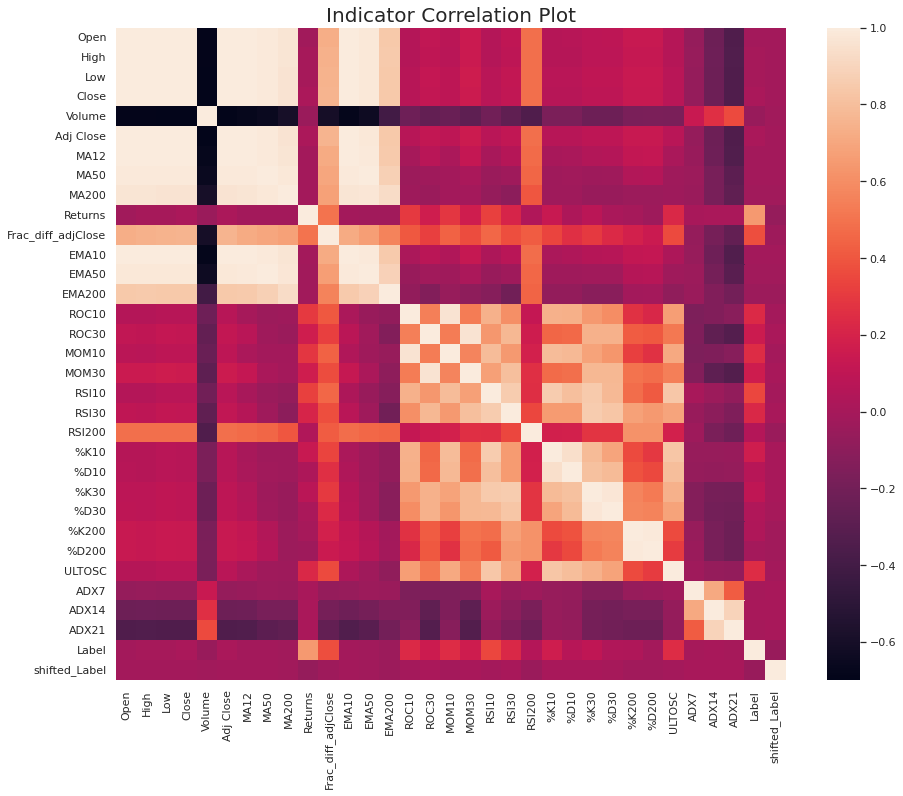

In [52]:
corr = indicators_df.dropna().corr()
plt.figure(figsize=(15, 12))
plt.title('Indicator Correlation Plot', fontsize=20)
sns.heatmap(corr); # fmt='.2f', annot=True # to see correlation values

In [54]:
pd.DataFrame(abs(corr['shifted_Label']).sort_values(ascending=False)[1:]).head(15).style.background_gradient(cmap='Blues')

,shifted_Label
Returns,0.064657
Label,0.050556
RSI200,0.043611
EMA200,0.036264
Frac_diff_adjClose,0.034403
%D200,0.020179
%K200,0.019089
MA200,0.018597
EMA50,0.018323
Volume,0.015960


Finally, store the dataframe as csv.

In [26]:
indicators_df.to_csv('data/indicators_df.csv')